### Social Graphs and Interactions Fall 2020 



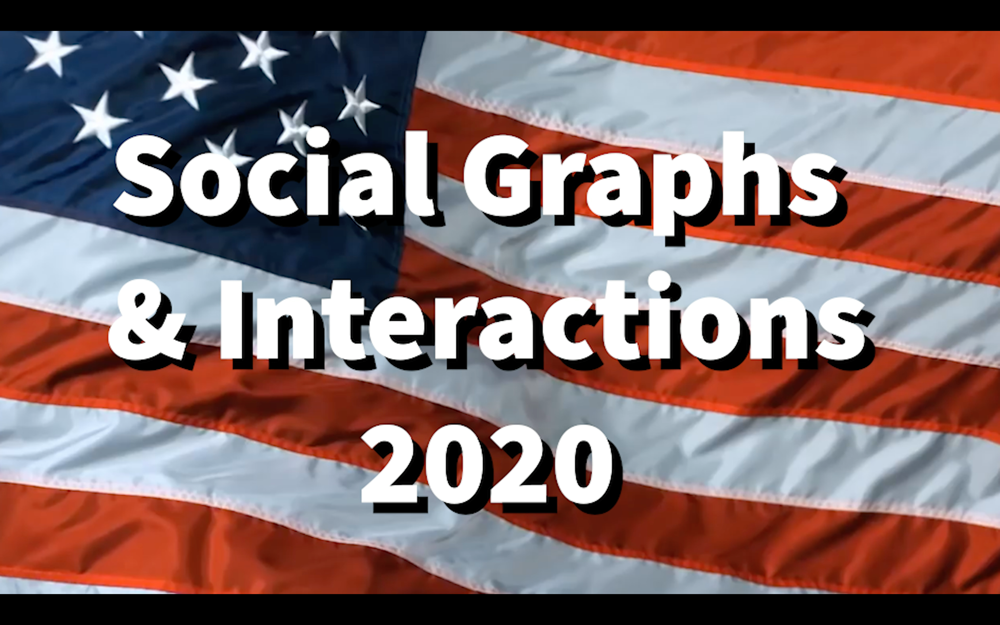

#### Team 
* Gauthier Belpaire, s193640
* Iman Chelhi, s165228
* Veniamin Tzingizis, s192851


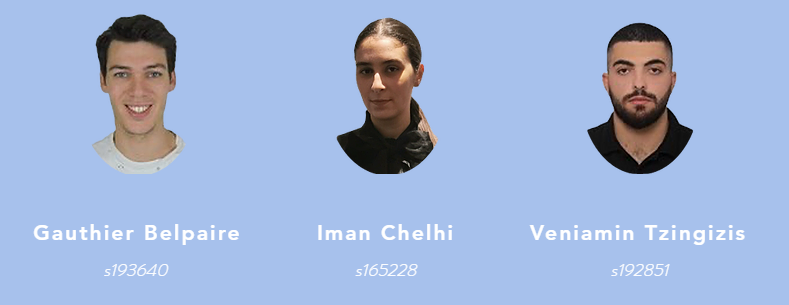

# The behavior of US voters for the 2020 Elections
**Links**

You can find our website [here](https://ichelhi.wixsite.com/my-site-2?fbclid=IwAR0qmOQQj6ZWfB65krk-k9fLwc0LzQ5uFNGYg8Q9DGduK9tZ_5BnUd9U1dE)

If there are any problems with displaying the results you can find our Google Colab Notebook [here](https://drive.google.com/file/d/14J7d6k0P3z9lDK_HkkAzkC5b10k0nsbF/view?usp=sharing), where everything is displayed properly

You can get the final data [here](https://drive.google.com/file/d/1aDEqhmreprqmeBrXmUrQMOvIaANhi4c8/view?usp=sharing) 

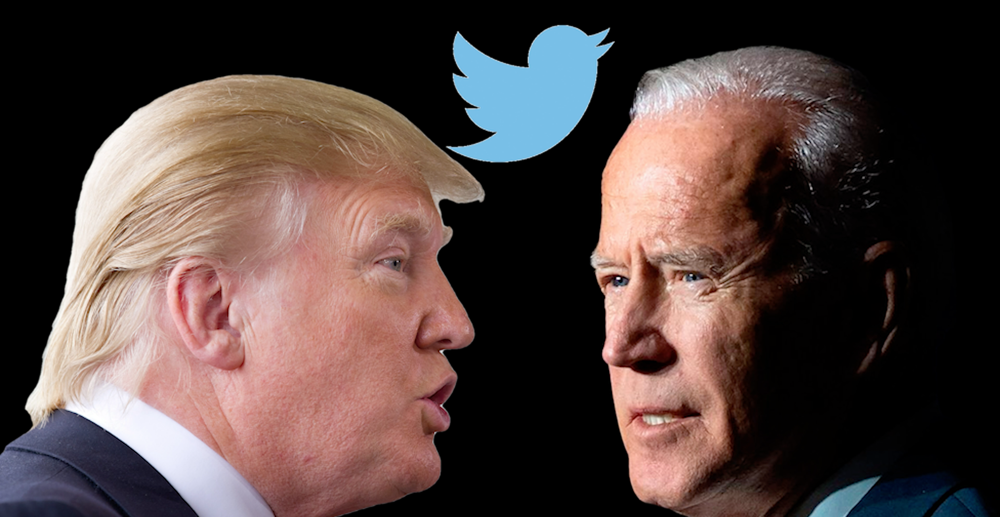

### Table of Contents

1. Introduction
2. Data Collection & Cleaning and Preliminary Analysis
3. Network Analysis
4. Sentiment Analysis
5. Conclusion
6. Contributions


#1. Introduction 

#### Motivation
The US election has for many years been a hot topic on many social media platforms including **Twitter**. The 2020 US election, which happened on November 3rd 2020, was no exception. The election created a large amount of buzz on Twitter thanks to the US voters. There is a lot of data that contains the **opinions** of people on Twitter. It seems like this data can hold tremendous value if analyzed correctly and for the right reasons. The last years the political landscape in Twitter has emerged. Political candidates use it more and more to get across to potential voters. For example Donald Trump is known to utilize Twitter daily to reach his followers and it can be a tool of great influence. The results of which can be seen from the people that use Twitter to express their opinions reagarding the elections. These opinions are what we aim to analyze and figure out the **general behaviour of voters**. 

#### Goal
This project will focus on understanding the **behaviour/activity of US voters** through their Tweets. How do people talk about different topics regarding the election? Do they have a faciliated thoughts that they try to put out or do they cheer who they support and talk down on who they do not? Is there any correlation that can be extracted between Twitter activity regarding the election and the actual election results? Questions like these are the main focal points of project and they can be summed up into three main analysis topics: 

1. What does the Twitter **behaviour** of US voters look like?
2. What are the **opinions** of the US voters regarding Biden and Trump?
3. Can the election results be **predicted** through Twitter?

#### Approach
To answer the questions we first need to get some data! The Twitter data has proven to be harder and harder to obtain over the years but there are some ways that still work! After getting the data and many hours of cleaning, the first question can be answered by NLP and general network analysis. For the second question, we use TF-TR and TF-IDF to identify the most important words and display them via word clouds. Furthermore, the results were visualized into a graph including the relations between the users and hashtags. For the third question, we are going to use sentiment analysis in order to indetify potential voters and who they support based on their Twitter activity and compare the results per state with the actual election results. 


Summing up the methodology and the tools that are going to be used:

1. General **Preliminary Analysis** empowered with **NLP** and **Network Theory** for describing the Twitter behaviour of the voters
2. **TF-TR** and **TF-IDF** associated with **word clouds** to extract the opinions of the voters
3. **Sentiment Analysis** and **Machine Learning** for identifying voters and comparing Twitter activity to election results


# 2. Data Collection & Cleaning and Preliminary Analysis

The majority of the data comes from Kaggle datasets. The time range of the tweets evole 2 weeks around the election date, November 3rd.

Supplementary data were extracted from the following two tools. 
* [twarc](https://github.com/DocNow/twarc) : Twitter API, High-Level Scraper 
* [2020 US Presidential Election Tweet IDs](https://github.com/echen102/us-pres-elections-2020): Probably the bigest collection of election Tweets on the net! 

After a lot of experimentation and searching, this was the easiest way to get a bulk of tweets. 
The data cleaning was a long tedius process with a lot of code that is probably out of the scope of the course to include all of it. For these reason only the key-points of the cleaning process will be included in this notebook in order to keep it short. Everybody wants to see the final result anyway😎 

Genral cleaning processes, instead of the usual format cleaning and prasing the key point for the cleaning was:
* Convert the RAW Twitter API data to structured form
* Detect the language of the tweets for the NLP, we only analyse English Tweets
* Taking the tweets that are from the USA trying to represent the voters

The data cleaning process is included at the end of the notebook in the apendix. For nerds only! 🤓 

You can get the final data [Here](https://drive.google.com/file/d/1aDEqhmreprqmeBrXmUrQMOvIaANhi4c8/view?usp=sharing) 


In [ ]:
import pandas as pd
import numpy as np 
from matplotlib import pyplot as plt 
from tqdm._tqdm_notebook import tqdm_notebook 
from tqdm import tqdm
tqdm_notebook.pandas()
pd.set_option('display.max_rows', 100)
pd.set_option('display.max_columns', 500)
import seaborn as sns
# Apply the default theme
sns.set_theme()
raw=pd.read_pickle('./FINAL_CLEAN.pickle.xz',compression='xz')
raw=raw.drop_duplicates(subset=['tweet','user_screen_name']) #drop duplicates that lead to spammers

C:\Users\Ben\anaconda3\envs\Twitter_Project\lib\site-packages\tqdm\std.py:699: FutureWarning: The Panel class is removed from pandas. Accessing it from the top-level namespace will also be removed in the next version
  from pandas import Panel


#### Taking a look at the clean data
---
Let's first take a look at the dataset. The most relevant information that was kept from all the available data was information about the **tweets and the user**. Regarding the tweet's information, the tweet itself is included as well as the clean hashtags and mentions that it has and the creation date. We have information which is related to the user like the profile descrption, location, city, state, amount of followers ect. More information was available but it was decided that these are the most relevant for the purpose of the analysis.

---

In [ ]:
raw.head()

,date_clean,user_screen_name,tweet,hashtags,mentions,language,created_at,tweet_id,user_id,user_name,user_description,source,user_followers_count,user_join_date,user_location,city,state,country,dataset,lang_detect
date_clean_date,,,,,,,,,,,,,,,,,,,,
2020-10-15,2020-10-15 00:00:02,snarke,"#Trump: As a student I used to hear for years,...",[Trump],[],,2020-10-15 00:00:02,1.31653e+18,8.436472e+06,snarke,"Will mock for food! Freelance writer, blogger,...",Twitter Web App,1185.0,2007-08-26 05:56:11,Portland,Portland,Oregon,United States of America,1,en
2020-10-15,2020-10-15 00:00:08,Ranaabtar,You get a tie! And you get a tie! #Trump ‘s ra...,"[Trump, Iowa]",[],,2020-10-15 00:00:08,1.31653e+18,4.741380e+07,Rana Abtar - رنا أبتر,"Washington Correspondent, Lebanese-American ,c...",Twitter for iPhone,5393.0,2009-06-15 19:05:35,Washington DC,Washington,District of Columbia,United States of America,1,en
2020-10-15,2020-10-15 00:00:25,changeillinois,"In 2020, #NYPost is being #censorship #CENSORE...","[NYPost, censorship, CENSORED, JoeBiden, Trump...","[jack, vijaya, dickc, KatieS, marciadorsey, jack]",,2020-10-15 00:00:25,1.31653e+18,1.994033e+07,Change Illinois | Biden will increase taxes by...,"Illinois, home of Lincoln and Reagan, used to ...",Twitter for iPhone,1396.0,2009-02-02 23:08:28,"Chicago, Illinois",Chicago,Illinois,United States of America,1,en
2020-10-15,2020-10-15 00:00:26,Anchorman_USA,#Trump #PresidentTrump #Trump2020LandslideVict...,"[Trump, PresidentTrump, Trump2020LandslideVict...",[],,2020-10-15 00:00:26,1.31653e+18,1.243315e+18,Ron Burgundy,"I'm kind of a Big Deal, People know me! I driv...",Twitter for Android,496.0,2020-03-26 23:14:28,"San Diego, CA",San Diego,California,United States of America,1,en
2020-10-15,2020-10-15 00:01:14,snarke,"#Trump: Nobody likes to tell you this, but som...",[Trump],[],,2020-10-15 00:01:14,1.31653e+18,8.436472e+06,snarke,"Will mock for food! Freelance writer, blogger,...",Twitter Web App,1185.0,2007-08-26 05:56:11,Portland,Portland,Oregon,United States of America,1,en


### Basic Statistics

In [ ]:
# handy function that counts the hashtag frequncy from a hashtag list.
def hashtag_freq(hash_list):
    """
    Returns the frequncy of the hastags
    Input: A series with lists of hashtags 
    """
    return pd.Series([item for sublist in hash_list for item in sublist])\
    .value_counts().rename_axis('hashtag').reset_index(name='freq')

print('No. of Users: ',raw.user_screen_name.nunique(),
      '\nNo. of Tweets: ',raw.tweet.shape[0],
      '\nNo. of Hashtags used: ',hashtag_freq(raw.hashtags).freq.sum(),
      '\nNo. of Mentions used: ',hashtag_freq(raw.mentions).freq.sum(),
      '\nNo. of Unique Hashtags used: ',hashtag_freq(raw.hashtags).shape[0],
      '\nNo. of Unique Mentions used: ',hashtag_freq(raw.mentions).shape[0])

No. of Users:  40475 
No. of Tweets:  144777 
No. of Hashtags used:  565154 
No. of Mentions used:  109766 
No. of Unique Hashtags used:  48593 
No. of Unique Mentions used:  23317


---
Taking a look at the Pandas Profiler for any further descriptive statistics information.

If you can't see this then please go to the Google Collab notebook.

---

In [ ]:
from pandas_profiling import ProfileReport
profile = ProfileReport(raw[['user_screen_name','tweet','date_clean','city','state']], title="Twitter Data Report")
profile

---
### Grouping the Users based on which candidate they mostly tweet about

The code cell below calculates the **frequency** of how much a user talks about Trump and Biden. This is firstly done on a tweet level, how many times the tweet refers to Trump or Biden related hashtags (the categorization of either Trump or Biden hashtags is done through the dictonaries seen below). At the next stage the tweets for each user are aggregated and a total frequency is generated. **This final frequency indicates if the user tweets mostly about either Biden or Trump.** There is also a thrid category which represents the neutral users, that either did not use Trump or Biden related hashtags or they mentioned them an equal amount of times. We call this group of users **Uncommited**, since they have not clearly commited their attention/activity to either candidate. This split is made to represent communities of users that we can analyse upon, something similar to the Universes in DC vs Marvel project. 

Summing up the above idea:

1. Go through each tweet and count how many times a Biden or Trump related hashtag is used. 
2. Aggregate the frequencies for each user. 
3. Ascertain which candidate hashtags has the biggest frequency, **Trump or Biden**
4. If the frequencies are the same, flag the user as **Uncommited**

Here it is important to clarify that for this stage of the report, the plots below can **not** represent the voters/supporters of either candidate. This is because people who tweet about Trump for example, can use Trump supporting hashtags **ironically or negatively**. In these cases, they clearly do not support him. For this reason splitting them into voters is **not repressentative of the reality**. That is why the split is made to people that **mostly talk/tweet about** either of them, for the time being. 

---

In [ ]:
# Categorization of Candidate and topics hashtags
topics_cat={'economy':'Economy' ,
         'StockMarket':     'Economy',  
           'Economy':    'Economy', 
          'business':     'Economy', 
           'stocks':    'Economy', 
             'Bitcoin': 'Economy', 
              'tax':'Economy',
             'healthcare':  'Health Care',
              'MedicalProfessionals': 'Health Care',
               'ObamaCare': 'Health Care',
              'Medicare': 'Health Care',
              'Healthcare': 'Health Care',
              'vaccine': 'Health Care',
              'CDC': 'Health Care',
              'ProLife':'Health Care',
              'Bidencare':'Health Care',
            'SupremeCourt': 'Supreme Court',
            'Townhall': 'Supreme Court',
            'Congress': 'Supreme Court',
            'Government': 'Supreme Court',
             'congress':   'Supreme Court',
             'government': 'Supreme Court',
              'DOJ': 'Supreme Court',
             'Constitution':  'Supreme Court',
              'dnc':'Supreme Court',
            'Covid19':'Covid',
             'coronavirus':  'Covid', 
              'COVID': 'Covid',
               'covid':  'Covid',
               'Covid19': 'Covid',
               'pandemic': 'Covid',
               'Covid':'Covid',
               'Coronavirus':'Covid',  
               'Pandemic':'Covid', 
               'TrumpCovid19':'Covid',  
               'WearAMask':'Covid', 
               'COVID__19': 'Covid',
               'SuperSpreader': 'Covid', 
               'Covid_19': 'Covid',
               'CoronaVirus':'Covid',
               'COVIDー19': 'Covid',
               'COVIDIOTS': 'Covid',
               'TrumpHasCovid': 'Covid',
              'TrumpLiedPeopleDied': 'Covid',
               'GOPSuperSpreaders': 'Covid',
               'TrumpKnew': 'Covid',
               'CoronavirusPandemic': 'Covid',
               'lockdown': 'Covid',
               'mask': 'Covid',
               'corona': 'Covid',
               'Mask': 'Covid',
               'trumpvirus': 'Covid', 
               'SuperSpreaderTrump': 'Covid',
               'MaskUp':'Covid',
             'BLM': 'Violent Crime',
               'blm': 'Violent Crime',
                'BlackLivesMatter': 'Violent Crime',
               'negligenthomicide':'Violent Crime', 
               'blacklivesmatter': 'Violent Crime',
               'Violence': 'Violent Crime',
               'PoliceBrutality':'Violent Crime',
            'NRA':'Gun Policy',
            'racism': 'Race and ethnic inequality',
             'Antifa':  'Race and ethnic inequality', 
             'racist':  'Race and ethnic inequality', 
              'TrumpIsARacist': 'Race and ethnic inequality', 
              'BlacksForTrump': 'Race and ethnic inequality',
              'SystematicRacism':'Race and ethnic inequality',
              'Latinos':'Race and ethnic inequality', 
              'ProudBoys':'Race and ethnic inequality',
               'BLEXIT':'Race and ethnic inequality',
              'NFL': 'Race and ethnic inequality',
              'BlackVoicesForTrump': 'Race and ethnic inequality',
              'BlackTwitter': 'Race and ethnic inequality',
              'Racism':'Race and ethnic inequality', 
              'Racist': 'Race and ethnic inequality',
              'antifa':'Race and ethnic inequality', 
              'WhiteSupremacy':'Race and ethnic inequality',
              'WhiteSupremacists':'Race and ethnic inequality', 
            'AOC':'Immigration',
            'ClimateChange':'Climate Change', 
             'ClimateAction': 'Climate Change', 
              'ClimateApocalypse': 'Climate Change',
              'climatechange': 'Climate Change',
               'climate':'Climate Change',
              'environment':'Climate Change',
            'LGBTQ':'LBGTQ', 
             'LGBT': 'LBGTQ',
            'lilwayne':'Fun',
             'LadyGaga': 'Fun',  
              '50Cent': 'Fun',
              'Borat':'Fun',
              'KanyeWest':'Fun'}

candidate_cats = {
    'Trump2020LandslideVictory':'Trump',
    'VoteTrump':'Trump',
    'VotePresidentTrump':'Trump',
    'MAGA':'Trump',
    'Trump2020':'Trump',
    'Trump': 'Trump',
    'trump': 'Trump',
    'DonaldTrump': 'Trump',
    'Trump2020': 'Trump',
    'MAGA': 'Trump',
    'TRUMP': 'Trump',
    'MAGA2020': 'Trump',
    'maga': 'Trump',
    'donaldtrump': 'Trump',
    'Republicans': 'Trump',
    'Trump2020Landslide': 'Trump',
    'trump2020': 'Trump',
    'KAG': 'Trump',
    'CountEveryVote': 'Trump',
    'Republican': 'Trump',
    'TRUMP2020ToSaveAmerica': 'Trump',
    'TrumpLandslideVictory2020': 'Trump',
    'KAG2020': 'Trump',
    'BackTrump': 'Trump',
    'StopTheSteal': 'Trump',
    'CountEveryVote': 'Trump',
    'MakeAmericaGreatAgain': 'Trump',
    'Biden': 'Biden',
    'JoeBiden': 'Biden',
    'BidenHarris2020': 'Biden',
    'biden': 'Biden',
    'BidenHarris': 'Biden',
    'KamalaHarris': 'Biden',
    'joebiden': 'Biden',
    'Biden2020': 'Biden',
    'Democrats': 'Biden',
    'TrumpMeltdown': 'Biden',
    'bidenharris2020': 'Biden',
    'TrumpIsLosing': 'Biden',
    'BidenHarrisToSaveAmerica': 'Biden',
    'DumpTrump': 'Biden',
    'PresidentElectJoe': 'Biden',
    'biden2020': 'Biden',
    'Harris': 'Biden',
    'BIDEN': 'Biden',
    'BidenHarrisLandslide2020': 'Biden',
    'TrumpCrimeFamily': 'Biden',
    'VoteBidenHarrisToSaveAmerica': 'Biden',
    'VoteBidenHarris2020': 'Biden',
    'BlueWave': 'Biden',
    'JoeBidenKamalaHarris2020': 'Biden',
    'VoteBlue': 'Biden',
    'BidenHarris2020ToSaveAmerica': 'Biden',
    'TrumpIsALaughingStock': 'Biden',
    'bidenharris2020': 'Biden',
    'JOEBIDEN2020': 'Biden',
    'BidenLandslide': 'Biden',
    'ByeByeTrump': 'Biden',
    'PresidentBiden': 'Biden',
    'PresidentElectJoeBiden': 'Biden',
    'BlueWave2020': 'Biden'}

class colors:
    HEADER = '\033[95m'
    BLUE = '\033[94m'
    CYAN = '\033[96m'
    GREEN = '\033[32m'
    WARNING = '\033[93m'
    FAIL = '\033[91m'
    END = '\033[0m'
    BOLD = '\033[1m'
    UNDERLINE = '\033[4m'

In [ ]:
# This functions replace the hashtags with the catageory the belong
def replace_hashtags(x):
    ret_list=[]
    for h in x:
        try:
            ret_list.append(candidate_cats[h])
        except:
            try:
                ret_list.append(topics_cat[h])
            except:
                ret_list.append(h)
    return ret_list

## Finding for who the users vote for by counting how many times the used 
## Hashtags that support Trump and Biden
raw['hashtags_replaced']=raw.hashtags.apply(replace_hashtags)
raw['trump_counts']=raw.hashtags_replaced.astype(str).str.count('Trump')
raw['biden_counts']=raw.hashtags_replaced.astype(str).str.count('Biden')
# >0 trump
# <0 biden
# 0 netural
# Counting the total times the user talked about Trump or Biden
raw['sup_sum']=raw.trump_counts-raw.biden_counts
raw.loc[raw.sup_sum>0,'tweets_about']='Trump'
raw.loc[raw.sup_sum<0,'tweets_about']='Biden'
raw.sup_sum=raw.sup_sum.fillna('Netural')
temp=raw.groupby('user_screen_name').sum()
temp.loc[temp.sup_sum>0,'tweets_about']='Trump'
temp.loc[temp.sup_sum<0,'tweets_about']='Biden'
tweets_about_dict=temp.tweets_about.to_dict()
# Filling the results to the main dataframe
raw['tweets_about']=raw.user_screen_name.map(tweets_about_dict)
raw=raw.drop(columns='sup_sum')
raw.tweets_about=raw.tweets_about.fillna('Uncommited')
raw.date_clean=pd.to_datetime(raw.date_clean)

---
Doing all the above we can categorize the users into 3 groups:
* The ones that mostly tweet about Biden
* The ones that mostly tweet about Trump
* The ones that are Uncommited to either Biden or Trump

As said before, a disclaimer to make here is that we do not know the sentiment of those tweets. This means that someone can mostly tweet about Trump with a negative sentiment. In order to group the users into potential voters we need to take a look at the sentiment. Spoiler alert, it is included later in the notebook so stay tuned! 😁 

---

In [ ]:
raw.groupby(['user_screen_name','tweets_about']).count().reset_index()[['user_screen_name','tweets_about']].sample(5)

,user_screen_name,tweets_about
20386,Tessacurly,Biden
32915,mallikachopra,Biden
16772,QueenClaudineW,Trump
28464,fuearnhardtJR,Trump
36548,rosenwald_eric,Trump


## User Activity

### Activity per Candidate

---
Regarding how the communites are represented in the dataset, we see that on a **User** level, more than **20.000 people tweet mostly about Biden** versus **15.000 about Trump** while **5.000 are Uncommited** out of the 40.000 total users in the dataset. When looking at the **Tweets plot** below, it is interesting to notice that there is a higher amount of tweets regarding Trump rather than Biden. On the other hand, on a **User** level, there are more users that tweet about Biden. Seems like Trump tweeters are more active than Biden ones even if Biden's tweeters are more. 

---

In [ ]:
raw=pd.read_pickle('FINAL_FINAL_DATASET.pickle')

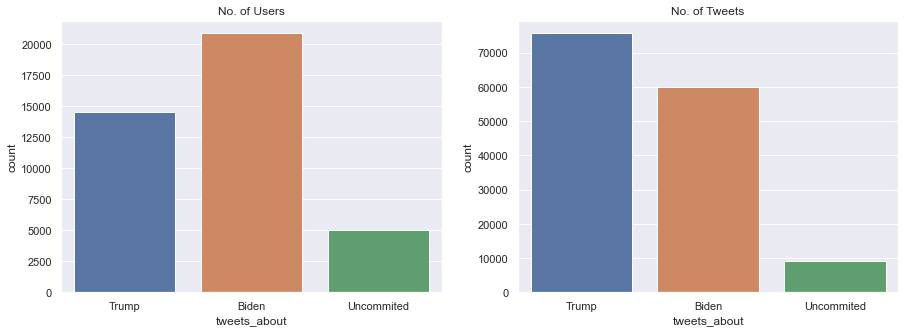

In [ ]:
#creating a users view
users_view=raw.groupby(['user_screen_name','tweets_about']).count().reset_index()[['user_screen_name','tweets_about']]
plt.figure(figsize=(15,5))
plt.subplot(1, 2, 1)
sns.countplot(x="tweets_about", data=users_view).set_title('No. of Users')
plt.subplot(1, 2, 2)
sns.countplot(x="tweets_about", data=raw).set_title('No. of Tweets');


### Activity per State

---
Now let's take a look at the **user activity per State**. No surprise, the most populated states (California, Texas, Florida and New York) have the highest activity. We also see that District of Columbia, aka. Washington DC, has very high tweet activity in relations to its population. For comparison, Florida and Texas are 30 and 42 times bigger respectively than DC in terms of population while they have similar activity!😲  Looks like the state of politics in USA has the highest Twitter activity related to the population! 

Wouldn't it be nice to compare the same plot before the election with the addition of sentiment and see if there is any correlation between the actual election results? 🤔 


---

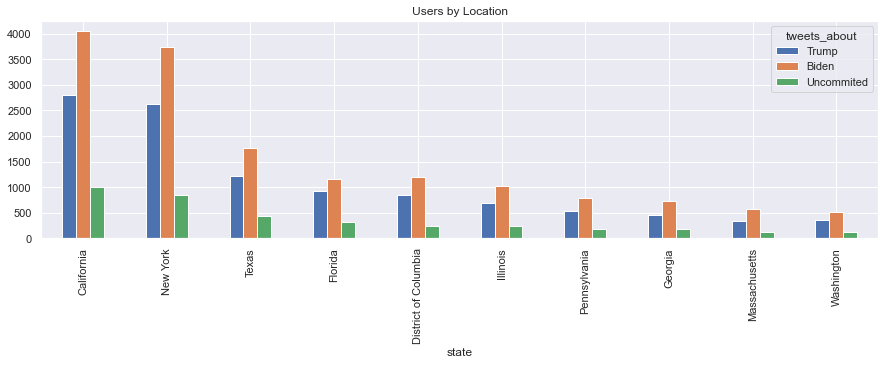

In [ ]:
view1=raw.pivot_table(columns='tweets_about',index='state',values='user_screen_name',aggfunc=lambda x: len(x.unique()))
view1['total']=view1.sum(axis=1)
view1.sort_values(by='total',ascending=False)[['Trump','Biden','Uncommited']]\
.head(10).plot.bar(figsize=(15,4),title='Users by Location');


##  Activity Trends


---
Now let's take a look at how are the tweets activity trend look!
It is apparent that we have a big spike on the 23rd and also the activity increases after November 3rd (election day) and on the 7th when the results are announced. We can see the surge of tweets about Biden on the 7th of November when he was announced president-elect. It will be interesting to examine the tweets before and after the election date. The spike on the 23rd is due to more data fetched from that date. It was decided not to normalize the data and flatten the curve since it doesn't interfere with the goals of this project. The more data the better!  

---

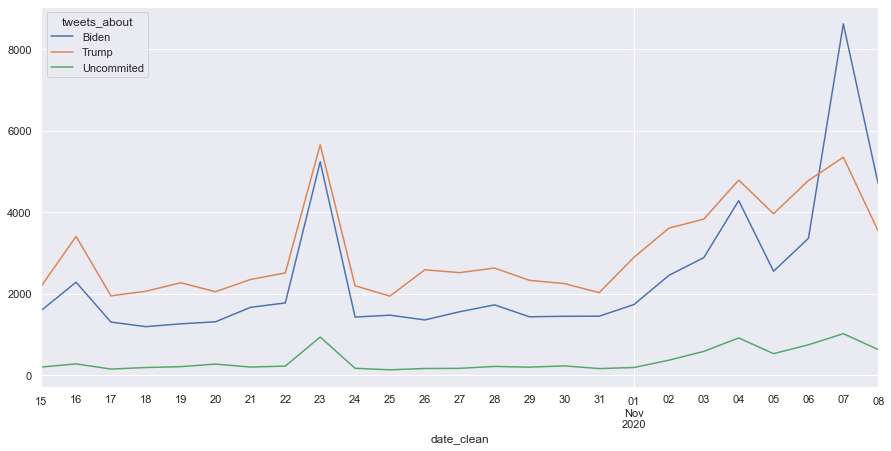

In [ ]:
raw.pivot_table(index='date_clean',columns='tweets_about',values='tweet',aggfunc='count').resample('d').sum().plot(figsize=(15,7));

### Weekly Trend

---
Taking a look at the daily trend, we see two things; firstly, the surge of Biden tweets on Saturday the 7th (election results announcement date) and secondly, most people use Twitter at the end of the week and on the weekend. 
Notice that the data has a big increase of activity on Friday the 23rd of October. That is why Friday has increased activity but if we see the data from Monday to Thursday it is clear that there is an upwards trend. It is expected that this trend would continue to increase until the weekend and drop back again if the data were to be normalized.

---

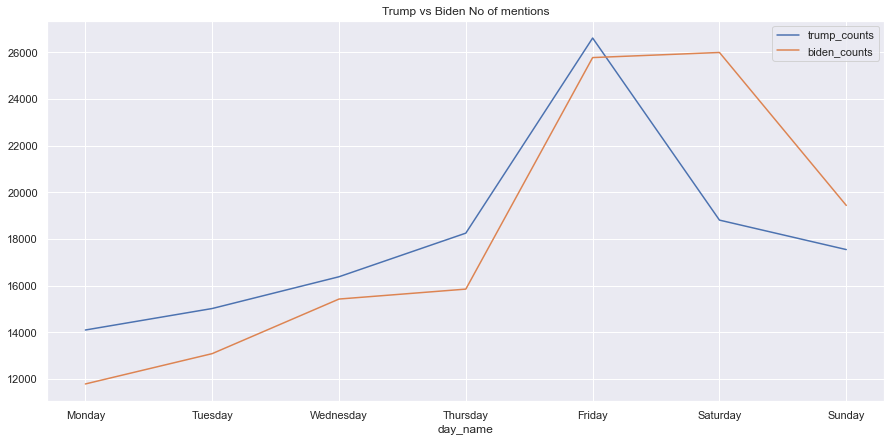

In [ ]:
raw['day_name']=raw.date_clean.dt.day_name()
day_cats = [ 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
from pandas.api.types import CategoricalDtype
cat_type = CategoricalDtype(categories=day_cats, ordered=True)
raw['day_name'] = raw['day_name'].astype(cat_type)
raw.groupby('day_name').sum()[['trump_counts','biden_counts']].plot(figsize=(15,7),title='Trump vs Biden No of mentions');

### Daily Trend

---
Now, here we see the daily trends of the three communities. It seems like the activity starts rising around 8-9 when most people are waking up. Until 16-17, the Trump tweeters are most active, 17 is the time most people are off work. At that time Biden tweeters catch up for around two hours. Then they drop again until midnight. It seems that Biden tweeters are **active mostly after work and before they go to sleep.** The same can be said for Trump tweeters but with less dinstictive changes during the day as Biden ones. All tweets have been filtered to USA only, so the time differences between states is not such a big factor here.  

---

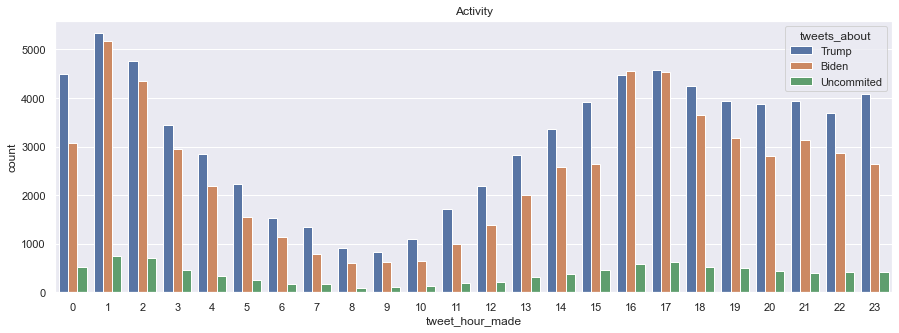

In [ ]:
raw['tweet_hour_made']=raw.date_clean.dt.hour
plt.figure(figsize=(15,5))
sns.countplot(x="tweet_hour_made", hue="tweets_about", data=raw).set_title('Activity');


### Top Hashtags

---
The hashtag frequency shows which topics the users talk about the most. It seems that the majority of them use hashtags related to **the canditates and the election**. There is little to **none** activity regarding topics like **Education, Economy, Healthcare** in the top 30 hashtags. That is surprising! We can see that there is some activity surrounding **COVID-19**.

An interesting approach would be to take out all the hashtags from the tweets and then see the word clouds of the tweets. Are there any differences between the hashtag the users use and what they actualy say? 

---

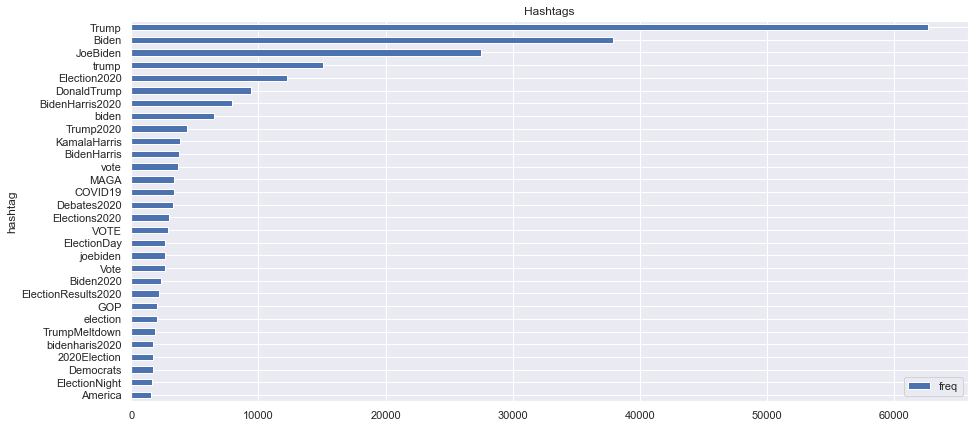

In [ ]:
hashtag_freq(raw.hashtags).set_index('hashtag').sort_values(by='freq').tail(30).plot.barh(figsize=(15,7),title='Hashtags');
# hashtag_freq(raw.hashtags_replaced).set_index('hashtag').sort_values(by='freq').tail(30).plot.barh(figsize=(15,7),title='Category Hashtags');

### Hashtag Distribution

---
Looking at the histograms below we see that users mostly use hashtags rather than mentions! It is also seen that the histograms follow the **Poisson distribution.**

---

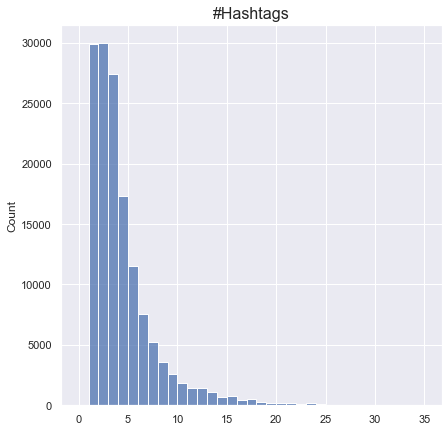

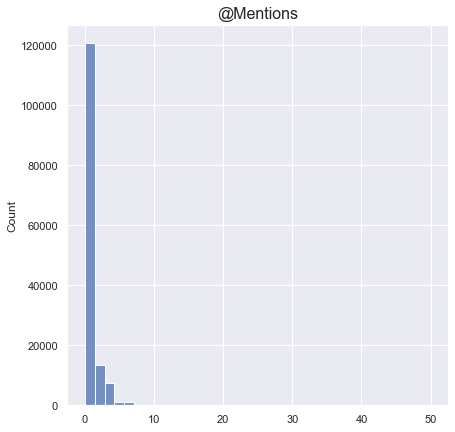

In [ ]:
# Sum the number of tokens in each Doc
# df['num_tokens'] = [len(token) for token in raw.hashtags]
# Visualize histogram of tokens per tweet

plt.figure(figsize=(15,7))
plt.subplot(1,2,1)
g = sns.histplot([len(token) for token in raw.hashtags],bins=35,kde=False)
plt.title('#Hashtags',fontsize=16)
plt.savefig('Hashtags.png')
plt.figure(figsize=(15,7))
plt.subplot(1,2,2)
g = sns.histplot([len(token) for token in raw.mentions],bins=35,kde=False)
plt.title('@Mentions',fontsize=16);
plt.savefig('Mentions.png')

## Sub-conclusion

From the analysis of the dataset, it is evident that Twitter data can generate some interesting insights. Firstly, we saw that there are more users that tweet about Biden rather than Trump, but on the other hand there are more tweets regarding Trump. Another interesting finding, is that the state of Washington DC has the same Twitter activity regarding the election as Texas or Florida which are 30 and 40 times bigger states in terms of population. Furethuremore, most people use Twitter after work hours around 17 and it spikes up again before bedtime. Also, from the hashtag analysis, it seems like people are not talking about topics like education, economy or healthcare but they mostly support or oppose the candidates.

# 3. Network Analysis

## Understanding of US voters behaviour on Twitter 

---
In this section, the behaviour of US Twitter users concerning the election is analysed. Do users have similar behaviour on Twitter or are some acting differently?

Furthermore, it has been previously analysed that some hashtags and the topics they relate to are particularly frequent. Therefore, it is seen that they play a major role in the election. But <b> what are the importance of the main hashtags compared to other hashtags? </b> Is there a big gap between their respective importance? 

To answer all these questions, the <b>bipartite graph connecting users and the hashtags in their tweets </b> is built. 

---

In [ ]:
#import the necessary packages
import nltk 
import re 
import pprint
import os
import math
import pickle
import community
import string
import requests
import wikipedia
import pickle
import random

import seaborn as sns
import networkx as nx
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from networkx.algorithms import bipartite
from collections import Counter
from tqdm import tqdm
from nltk import *
from nltk import word_tokenize
from nltk import RegexpTokenizer
from nltk.corpus import stopwords
from tqdm._tqdm_notebook import tqdm_notebook 
tqdm_notebook.pandas()
from IPython.display import display
from os import path
from PIL import Image
from fa2 import ForceAtlas2
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
from statistics import mean
from nltk.tokenize.treebank import TreebankWordDetokenizer
from sklearn.feature_extraction.text import TfidfVectorizer

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:28: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.*` instead of `tqdm._tqdm_notebook.*`
/opt/anaconda3/lib/python3.7/site-packages/tqdm/std.py:658: FutureWarning: The Panel class is removed from pandas. Accessing it from the top-level namespace will also be removed in the next version
  from pandas import Panel


In [ ]:
def flatten(l):
    return [item for sublist in l for item in sublist]

In [ ]:
#Load the data
raw=pd.read_pickle('FINAL_FINAL_DATASET.pickle')
raw.loc[raw.tweets_about=='Netural','tweets_about']='both parties'
data1=raw
data1=data1.rename(columns={'tweets_about':'politicalParty'})

#Define the hashtags pointed in by the tweets 
data1['connections']=data1.apply(lambda x: [(x.user_screen_name,i) for i in x.hashtags], axis=1)
data1=data1.reset_index()

#The users that have the same name than a topic are removed to make sure the graph is bipartite
usersWithTopicNames=list(set(list(data1.user_screen_name))&set(flatten(list(data1.hashtags))))
data1=data1.drop(list(data1.loc[data1.user_screen_name.isin(usersWithTopicNames)].index))

### Add a column with the candidate targeted by each tweet (>0: trump, <0 biden, 0 Uncommitted)
data1['sup_sum']=data1.trump_counts-data1.biden_counts
data1.loc[data1.sup_sum>0,'targetedCandidate']='Trump'
data1.loc[data1.sup_sum<0,'targetedCandidate']='Biden'
data1.targetedCandidate=data1.targetedCandidate.fillna('Uncommitted')
data1=data1.drop(columns='sup_sum')

#Drop the spam, which are duplicates tweets
L=len(data1)
data1=data1.drop_duplicates(subset=['user_screen_name','tweet'])
print("Removing spams removes: ", round((L-len(data1))*100/L,0), "% of the tweets.")

#Drop https in the tweets by using regexp
data1['tweet']=data1.tweet.apply(lambda x:
                        re.sub(r'(?:(?:https?|ftp):\/\/)?[\w/\-?=%.]+\.[\w/\-?=%.]+',"",x))

Removing spams removes:  11.0 % of the tweets.


In [ ]:
def createGraph(df,sourceName,targetName,partyCol): #dataframe with columns nodes, neighbours, attributes
    G = nx.Graph() #Creating Digraph
    source=list(set(df[sourceName].tolist()))
    target=list(set(df[targetName].sum()))
    red='#ff0000'
    blue='#2b00ff'
    
    #Create a (node, attr) colum with the political party attribute
    df['nodes - attributes']=df.apply(lambda x:(x[sourceName],{partyCol:x[partyCol],
                                                                    'node_type':'user','color':red}),axis=1)
    
    #Add the nodes with attributes
    G.add_nodes_from(list(df['nodes - attributes']))
    G.add_nodes_from(target,color=blue,node_type='topic') #Add nodes 
    
    #Add edges
    connections=flatten(df.connections.to_numpy()) 
    G.add_edges_from(connections)
    nodes_before=len(G.nodes)

    #Remove nodes without degrees
    remove=[node for node,degree in dict(G.degree).items() if degree == 0]
    G.remove_nodes_from(remove)
    nodes_after=len(G.nodes)

    #Adding degree as attributes
    for i in G.nodes:
        G.nodes[i]['degree'] = int(G.degree[i])
    
    return G

In [ ]:
#Create the graph
G=createGraph(data1,'user_screen_name','hashtags','politicalParty')

#Count the number of unique hashtags and the number of unique users 
hashtagNodes=list(set(flatten(list(data1.hashtags))))
userNodes=list(set(data1.user_screen_name))
print("The number of unique hashtags is:",len(hashtagNodes))
print("The number of unique users is:",len(userNodes))

print("The number of links between users and hashtags is:",G.number_of_edges())

The number of unique hashtags is: 47983
The number of unique users is: 40312
The number of links between users and hashtags is: 300335


---
The number of unique hashtags is pretty high. It is due to the fact that <b> plenty of different hashtags </b> are used on Twitter. <b> Lots of them are different but relate to the same topic.</b> The number of links between users and hashtags is really high. On average a user has used 7 hashtags in the tweets they published, which seems realistic.

---

In [ ]:
def Centrality(G,method):
    if method=="betweeness":
        #Nodes the most often on the shortest paths when considering all shortest paths from any node to any node.
        degreeCentrality=nx.betweenness_centrality(G) 
    elif method=="eigenvector": #Nodes with high degrees and also linked to high degrees nodes
        degreeCentrality=nx.eigenvector_centrality(G)
    elif method=="degree": #Degree centrality = degree / total number of nodes
        degreeCentrality=nx.degree_centrality(G)
    
    return(degreeCentrality)

def mostCentralNodes(G,method,topN):
    degCentrality=Centrality(G,method)
    centralNodes=[(n,d) for n,d in sorted(degCentrality.items(),key=lambda item:item[1],reverse=True)][:topN]
    
    return centralNodes

In [ ]:
#Method is either 'degree','betweeness','eigenvector'
centralNodes=mostCentralNodes(G,'degree',20)
centralNodes=[(x[0],round(x[1],2)) for x in centralNodes]

df_centralNodes = pd.DataFrame(centralNodes, columns =['Node', 'Degree centrality'])

print("The most central nodes are:")
print(" ")
print(df_centralNodes)

The most central nodes are:
 
               Node  Degree centrality
0             Trump               0.17
1             Biden               0.17
2          JoeBiden               0.14
3             trump               0.07
4      Election2020               0.06
5   BidenHarris2020               0.05
6             biden               0.04
7       DonaldTrump               0.04
8      KamalaHarris               0.03
9              vote               0.02
10        Trump2020               0.02
11    Elections2020               0.02
12         joebiden               0.02
13      BidenHarris               0.02
14      Debates2020               0.02
15          COVID19               0.02
16             VOTE               0.02
17      ElectionDay               0.02
18   bidenharis2020               0.02
19        Biden2020               0.02


---
The nodes with the highest degrees in the original graph are hashtags. It is expected that hashtags generally have higher degrees than users as the main hashtags are likely to be pointed out by a lot of tweets, while the most active users post several tweets with few hashtags in it. As a result, <b> users degrees are less likely to have a high degree centrality than hashtags. </b>

The hashtags with the highest degrees are the most mentioned in the tweets and therefore are linked to a lot of users. <b> The most mentioned hashtags are related to Trump, Biden and the 2020 election.

---

In [ ]:
def degDistribution(values,step1=10):
    kmin=min(values)
    kmax=max(values)

    #create the distribution binning 
    print("THE ZERO DEGREES ARE EXCLUDED FROM THE DISTRIBUTION")
    
    #Create the histogram and bins
    v=np.arange(max(kmin,1),kmax+1,step=step1) #bins exclude values in [0,1(, which means zero degrees
    h=np.histogram(values,bins=v)  
    
    #Plot the in degree distribution 
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.hist(values,bins=v)
    v=[sum(x)/2 for x in zip(h[1][:-1],h[1][1:])] #Create the required bins
    ax2.scatter(v,h[0],s=30)
    
    #Set scales
    ax2.set_xscale('log')
    ax2.set_yscale('log')

    #Add legends and title
    ax1.set_title('Histogram of the degree distribution [Isolated]',fontsize=25)
    ax2.set_title('Degree distribution (Log-Log) [Isolated]',fontsize=25)

    #Set labels for axes
    ax1.set_xlabel('Degree',fontsize=25)
    ax1.set_ylabel('Frequency',fontsize=25)
    ax2.set_xlabel('Degree',fontsize=25)
        
    #Set Y limits
    ax2.set_ylim(bottom=0.1,top=1.1*max(h[0]))

THE ZERO DEGREES ARE EXCLUDED FROM THE DISTRIBUTION


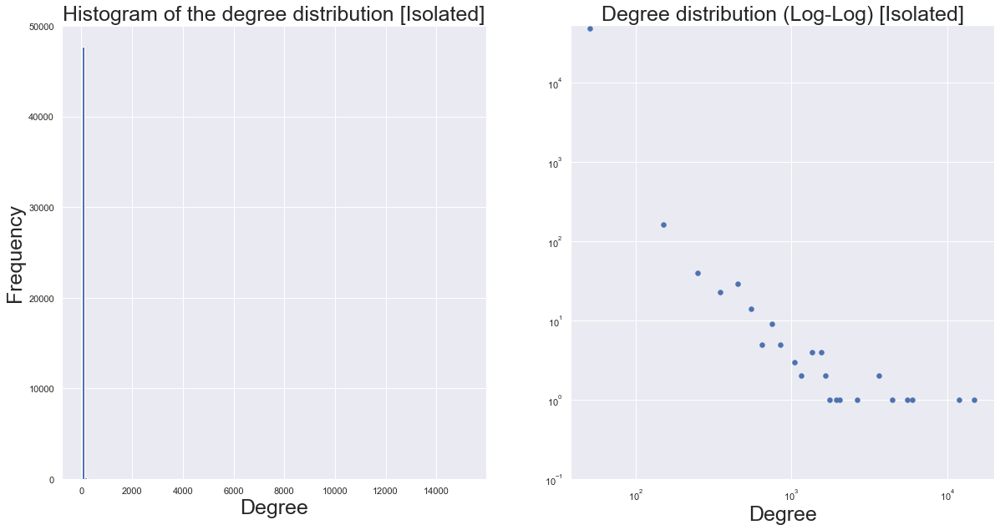

In [ ]:
#Degree distribution of the hashtags in the original graph
degreeHashtags=[d for (n,d) in dict(G.degree()).items() if n in hashtagNodes]
degDistribution(degreeHashtags,step1=100) 

---
It can be observed that the <b> hashtag's degrees follow a scale-free trend. </b> It is expected as there is a <b> preferential attachment phenomenon concerning the hashtags people use.</b>  The most popular hashtags, such as "Trump", "Biden", "Elections2020", tend to be more and more used through time while their popularity on Twitter grow. 

---

THE ZERO DEGREES ARE EXCLUDED FROM THE DISTRIBUTION


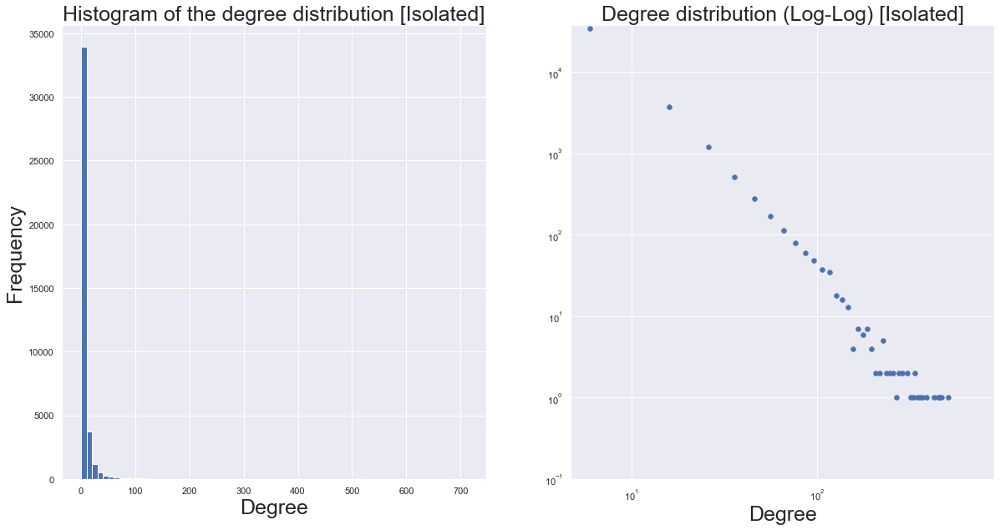

In [ ]:
#Degree distribution of the users in the original graph
degreeUsers=[d for (n,d) in dict(G.degree()).items() if n in userNodes]
degDistribution(degreeUsers,step1=10)

---
<b> The user's degrees also follow a scale-free distribution. </b> Some user accounts relate to news, that has a team who publish tweets on a regular basis. These types of accounts are likely to use lots of different hashtags as they tweet a lot. This explains the fact that the number of unique hashtags used by users follow a scale-free distribution.

To conclude, some hashtags are central and are therefore the core topics of the 2020 election, while others are minor. Concerning users, some of them tend to tweet a lot while some only tweet once in a while. The big users are likely to be influential if they are followed by a lot of followers.

---

# Understanding of relationships between hashtags

---
It has been seen that the number of hashtags is very high, as lots refer to the same topic. <b> Analysing the relationship between them and understanding how they relate to each other is interesting. </b> 

<b> The projection of the graph on hashtags </b> is built. In this graph, hashtags are connected if they are mentioned by the same user, which means that they are all part of the same user interest. 

---

In [ ]:
#A bipartite graph is such that two sets (U,V) exist such as all nodes are either in U, either in V  
#and there is no links between nodes in U, neither links between nodes in V
print("Is the graph a bipartite graph? ", nx.is_bipartite(G))

#Create the projected graph for hashtags
G_hashtags=bipartite.projected_graph(G,hashtagNodes)  

Is the graph a bipartite graph?  True


---
The graph has been correctly built, and is therefore truly **bipartite**. Projections of the graph can therefore be built and analysed.

---

In [ ]:
def characteristicsGraph(G):
    print("Main characteristics:")
    print("    Number of nodes: ",G.number_of_nodes())
    print("    Number of links: ",G.number_of_edges())
    
    print("----")
    print("Degree characteristics:")
    Degrees=list(dict(G.degree()).values())
    print("    Average degree: ",round(np.average(Degrees),2))
    print("    Min degree: ",min(Degrees))
    print("    Max degree: ",max(Degrees))
    
    print("----")
    #print("Average distance: ",round(nx.average_shortest_path_length(G),2))
    
    #G_un=G.to_undirected(reciprocal = False, as_view = False)
    '''nbConnectedComponents=nx.number_connected_components(G)
    
    if nbConnectedComponents>1:
        print("FOR THE UNDIRECTED GRAPH: ")
        print("Number of connected components: ",nbConnectedComponents)
        
        #Characteristics of the biggest connected component
        print("----")
        print("FOR THE BIGGEST CONNECTED COMPONENT")
        #Extracting the Giant Component
        #GCC = G.subgraph(max(nx.weakly_connected_components(G), key = len))
        GCC=G.subgraph(max(sorted(nx.connected_components(G), key=len, reverse=True)))
        characteristics(GCC)
    else:
        print("Number of connected components: ",1)'''

In [ ]:
#Get the main characteristics of the projection on hashtags 
characteristicsGraph(G_hashtags)

Main characteristics:
    Number of nodes:  47983
    Number of links:  4070228
----
Degree characteristics:
    Average degree:  169.65
    Min degree:  0
    Max degree:  33949
----


---
The number of links between hashtags is high, with an average degree of 169. It means <b> that topics mainly relate to each other. The highest degree is also very high, which means that at least one subject is really central for the whole graph. </b>

---

In [ ]:
#Method is either 'degree','betweeness','eigenvector'
centralNodes=mostCentralNodes(G_hashtags,'degree',20)
centralNodes=[(x[0],round(x[1],2)) for x in centralNodes]

df_centralNodes = pd.DataFrame(centralNodes, columns =['Node', 'Degree centrality'])

print("The most central nodes are:")
print(" ")
print(df_centralNodes)

The most central nodes are:
 
               Node  Degree centrality
0             Trump               0.71
1             Biden               0.65
2          JoeBiden               0.53
3      Election2020               0.40
4             trump               0.38
5   BidenHarris2020               0.33
6       DonaldTrump               0.33
7           COVID19               0.32
8              vote               0.27
9             biden               0.26
10     KamalaHarris               0.26
11              GOP               0.26
12          America               0.25
13      BidenHarris               0.25
14             Vote               0.24
15             VOTE               0.24
16     Pennsylvania               0.24
17            Obama               0.24
18      ElectionDay               0.23
19        Democrats               0.23


---
<b> The most central hashtags relate to Trump, Biden and the 2020 election. </b> Their degree centrality is very high which means that they are connected to many other hashtags. It is expected as the dataset concerns the election, so the two main candidates and the election itself are central topics.

The highest degree nodes are similar to the one in the original graph, as the high degree nodes in the original graph tend to be highly connected in the projected graph. But it can be seen that "COVID19" has a higher degree centrality in the projected graph. In the original graph, "COVID19" has the 15th highest degree centrality but in the projected graph it has the 7th highest degree centrality. <b> It means that COVID19 is not mentioned the most by users but relates to a lot of other topics. </b>

---

In [ ]:
def degreeDistribution(G,case,step1=10):
    if case=='in':
        degrees=list(dict(G.in_degree()).values())
    elif case=='out':
        degrees=list(dict(G.out_degree()).values())
    elif case=="in+out":
        degrees=list(dict(G.degree()).values())
    
    degDistribution(degrees,step1)

THE ZERO DEGREES ARE EXCLUDED FROM THE DISTRIBUTION


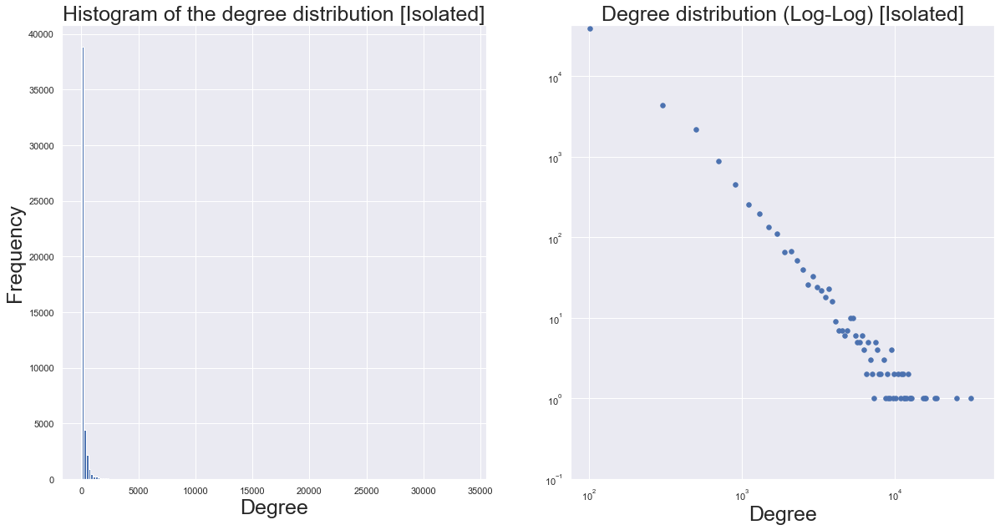

In [ ]:
degreeDistribution(G_hashtags,'in+out',step1=200)

---
<b> A scale-free distribution is again observed. </b> This is due to the fact that, as seen previously, some hashtags, such as "Trump", "Biden", "Elections2020" are preferentially used and therefore have a high degree in the original graph. These topics are also major to the 2020 election and are therefore likely to be mentioned with a lot of others hashtags in their tweets. <b> By their frequency and the fact that they relate to a lot of other hashtags, hashtags about candidates and the election have particularly high degrees in the projected graph. </b> These main hashtags also coexist with less popular hashtags, relating to less important topics or with an atypical wording. These hashtags relate to fewer other hashtags. All these reasons explain that a scale-free property can be observed in the hashtag degrees of the projection.

---

In [ ]:
def compareDistribution(G,ref,step1=100,step2=100):
    #Calculate the in + out degree distribution, kmin and kmax for G
    degrees=list(dict(G.degree()).values())
    kmin = min(degrees)
    kmax = max(degrees)
    
    N = G.number_of_nodes()

    if ref=='random':
        #Calculate p
        k = np.average(degrees)
        p = k / (N-1)

        #Create the random network
        G1 = nx.erdos_renyi_graph(N,p)
    elif ref=='scale-free':
        G1=nx.scale_free_graph(N)
        
    #Random network
    degrees1 = list(dict(G1.degree()).values())
    kmin1 = min(degrees1)
    kmax1 = max(degrees1)

    v = np.arange(max(min(kmin,kmin1), 1), max(kmax,kmax1) + 1, step=step1) #bins exclude values in [0,1(, which means zero degrees
    
    #create the distribution binning 
    h = np.histogram(degrees, bins = v)  #G network
    
    v1=np.arange(max(min(kmin,kmin1), 1), max(kmax,kmax1) + 1, step=step2)
    h1 = np.histogram(degrees1, bins = v1)  #Reference network
    
    #Plot
    f, (ax1, ax2) = plt.subplots(1, 2, figsize = (20,10))
    #For the ax1
    ax1.hist(degrees, bins=v,label = "G network")
    ax1.hist(degrees1, bins=v1, label = ref + " network")
    
    #For the ax2
    v=[sum(x)/2 for x in zip(v[:-1],v[1:])]
    v1=[sum(x)/2 for x in zip(v1[:-1],v1[1:])]
    ax2.scatter(v1, h1[0], s = 30, label = ref + " network")
    ax2.scatter(v,h[0], s = 30, label = "G network")

    #Add legends and title
    ax1.set_title('Histogram of the degree distribution [Isolated]', fontsize = 25)
    ax2.set_title('Degree distribution (Log-Log) [Isolated]', fontsize = 25)

    #Set scales
    ax2.set_xscale('log')
    ax2.set_yscale('log')

    #Show legends
    ax1.legend()
    ax2.legend()
    
    #Set x and y limits
    ax1.set_xlim(0.9*min(v),1.1*max(v))
    ax1.set_ylim(0.9*min(degrees+degrees1),1.1*max(degrees+degrees1))
    ax2.set_xlim(0.9*min(v),1.1*max(v))
    ax2.set_ylim(0.9*min(degrees+degrees1)+0.1,1.1*max(degrees+degrees1))

    #Set labels for axes
    ax1.set_xlabel('Degree')
    ax2.set_xlabel('Degree')
    ax1.set_ylabel('Frequency')

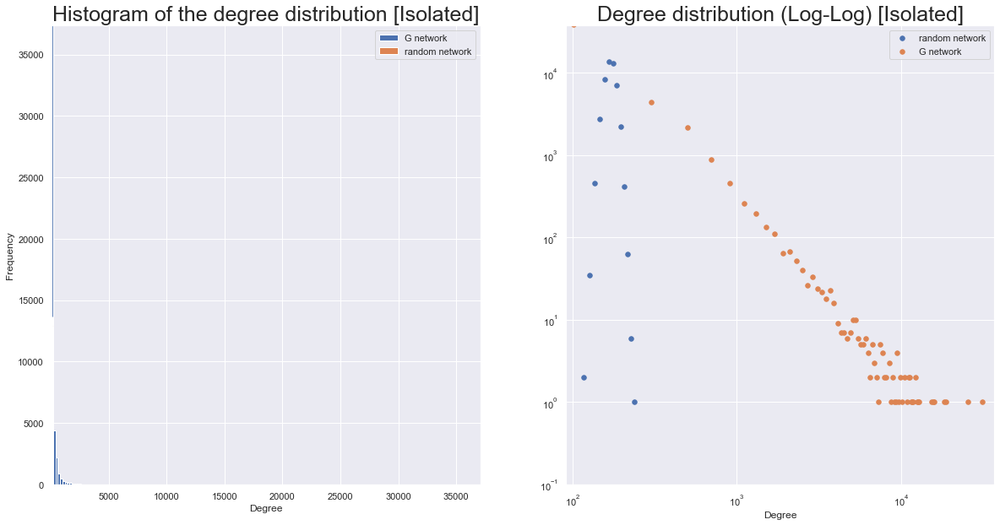

In [ ]:
compareDistribution(G_hashtags,'random',step1=200,step2=10)

---
When comparing the projection of hashtags with the corresponding random network, it can be seen that the degree distribution significantly differs. For the random network, most of the degrees are around the mean value while the degree distribution is well spread out for the scale-free networks. As said before, it means that <b> really popular hashtags coexist with minor ones </b>.

To conclude, the hashtag's degrees in the projected graph follow a scale-free distribution. Some hashtags are central to the 2020 election as they are connected to a lot of other hashtags while others are minor and only relates to few others hashtags.

---

# Common/distinct topics between Trump and Biden communities

<b> Twitter users from Trump and Biden communities might be interested in different topics or might have different points of view on same topics </b> as Trump and Biden have different main hot topics on their agenda. But <b> at the same time, the election concerns general topics, such as education, covid, that concern both political parties.</b> 

Finally, <b> are Trump and Biden communities interested in the same topics? </b> This question will be answered through <b> a network visualisation. </b>  The visualisation will enable us to <b> determine to what extent both communities are mixed around topics. </b> 

In [ ]:
data1_sample=data1.sample(6000)
#Add the color associated to the party
red='#ff0000'
blue='#2b00ff'
black='#000000'
yellow='#ffff00'
white='#808080'
data1_sample['colorParty']=data1_sample.politicalParty.replace(to_replace=
                                            {'Trump':red,'Biden':blue,'both parties':yellow})

In [ ]:
def createGraph(df,sourceName,targetName,partyCol,colorName): #dataframe with columns nodes, neighbours, attributes
    G = nx.Graph() #Creating Digraph
    source=list(set(df[sourceName].tolist()))
    target=list(set(df[targetName].sum()))
    
    #Create a (node, attr) colum with the political party attribute
    df['nodes - attributes']=df.apply(lambda x:(x[sourceName],{partyCol:x[partyCol],
                                                'node_type':'user','color':x[colorName]}),axis=1)
    
    #Add the nodes with attributes
    G.add_nodes_from(list(df['nodes - attributes']))
    G.add_nodes_from(target,color=black,node_type='topic') #Add nodes 
    
    #Add edges
    connections=flatten(df.connections.to_numpy()) 
    G.add_edges_from(connections)
    nodes_before=len(G.nodes)

    #Remove nodes without degrees
    remove=[node for node,degree in dict(G.degree).items() if degree == 0]
    G.remove_nodes_from(remove)
    nodes_after=len(G.nodes)

    #Adding degree as attributes
    for i in G.nodes:
        G.nodes[i]['degree'] = int(G.degree[i])
    
    return G

In [ ]:
#Create the a sample of the graph
G_sample=createGraph(data1_sample,'user_screen_name','hashtags','politicalParty','colorParty')

#Count the number of unique hashtags and the number of unique users 
hashtagNodes=list(set(flatten(list(data1_sample.hashtags))))
userNodes=list(set(data1_sample.user_screen_name))
print("The number of unique hashtags is:",len(hashtagNodes))
print("The number of unique users is:",len(userNodes))

print("The number of links between users and hashtags is:",G_sample.number_of_edges())

The number of unique hashtags is: 5575
The number of unique users is: 4086
The number of links between users and hashtags is: 19649


In [ ]:
def drawForceAtlasGraph(G,att,color,it=1000,alpha1=0.1,gravity1=0.0005):
    G_un=G.to_undirected(as_view = False)
    
    #Assigning ColorMaps for nodes and edges
    edge_colormap = []
    for i in tqdm(G.edges):
        source = G.nodes[i[0]]
        target = G.nodes[i[1]]
        if source[att] == target[att]:
            edge_colormap.append(source[color])
        else:
            edge_colormap.append(white)#edges between users and hashtags are white
                                        
    node_colormap = [G.nodes[n][color] for n in G.nodes()]

    node_degree = [G.nodes[n]['degree'] for n in G.nodes()]# to be used for node size
    #Element-wise multiplication of the size with a constant
    #to adjust the size of the node for higher visual fidelity
    node_degree_weighted = np.multiply(node_degree,0.5)
    
    #Force atlas
    forceatlas2 = ForceAtlas2(
                            # Behavior alternatives
                            outboundAttractionDistribution = False,  # Dissuade hubs
                            adjustSizes = False,  # Prevent overlap (NOT IMPLEMENTED)
                            edgeWeightInfluence = 0.9,
                            # Performance
                            jitterTolerance = 0.05,  # Tolerance
                            barnesHutOptimize = True,
                            barnesHutTheta = 1.2,
                            # Tuning
                            scalingRatio = 8,
                            strongGravityMode = False,
                            gravity = gravity1,
                            # Log
                            verbose = True)

    positions = forceatlas2.forceatlas2_networkx_layout(G_un, pos = None, iterations = it)
    
    plt.figure(figsize = (30,20))
    #using node_degree for the node size
    nx.draw_networkx_nodes(G_un, positions, node_size = node_degree_weighted, 
                           node_color = node_colormap, alpha = 0.8)
    nx.draw_networkx_edges(G_un, positions, edge_color = edge_colormap, alpha = alpha1)
    plt.axis('off')
    
    #Save the figure
    #fig = plt.gcf() #get current figure
    #plt.savefig('Network vizualisation.svg', dpi=700, format="svg")
    plt.show()
    

100%|██████████| 1000/1000 [05:22<00:00,  3.10it/s]


BarnesHut Approximation  took  93.90  seconds
Repulsion forces  took  213.53  seconds
Gravitational forces  took  0.80  seconds
Attraction forces  took  1.97  seconds
AdjustSpeedAndApplyForces step  took  3.63  seconds


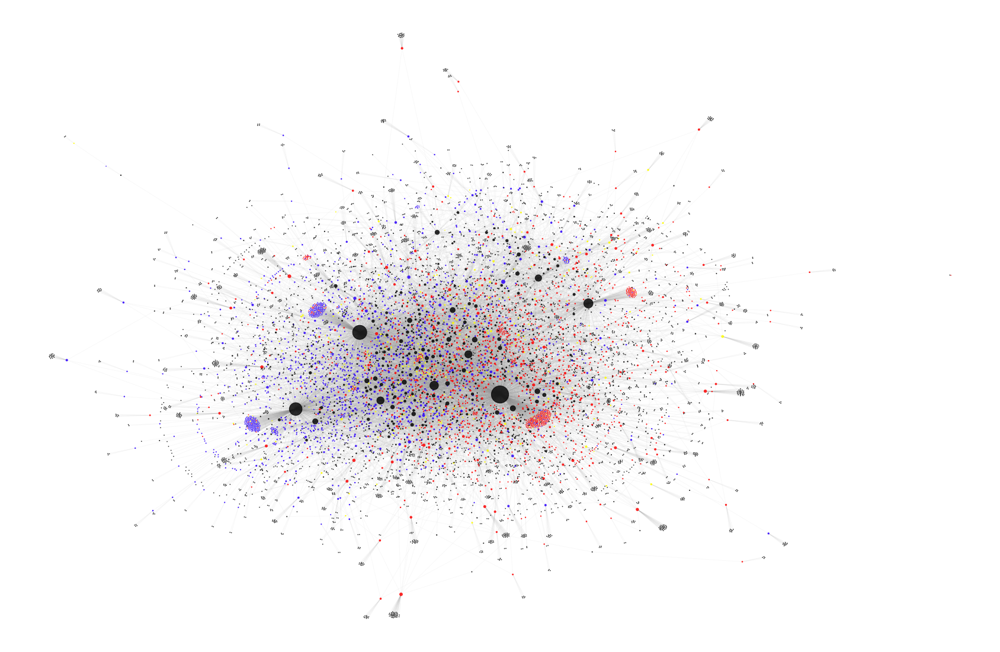

In [ ]:
#Draw the network 
#Users are red, hashtags are blue
drawForceAtlasGraph(G_sample,'node_type','color',it=1000,alpha1=0.05,gravity1=0.0002)

--- 
Users are in red and hashtags are in blue. The node size is proportional to the degree of the node. As seen previously in the degree distribution, <b> users tend to have low degrees compared to hashtag degrees </b> as each user connects to the few hashtags that they mention in their tweets. Furthermore, some hashtags are popular and, therefore, mentioned by a lot of users. 

It can be observed that users from a same community are **grouped together**. Blue nodes (users tweeting about Biden) are mostly on the left side while red nodes (users tweeting about Trump) are on the right side. It can also be observed that the **main hashtags relate to a single community** as they are mostly surrounded by users of one color. It is expected as major hashtags such as "Trump" and "Biden" are likely to relate to users that tweet about the associated candidate.

<b> In the center of the graph, user nodes are mixed between both communities around medium amount of importance topics, which mean that similar topics interest them. </b> It is likely that topics like "elections2020" or "Covid" are part of these shared topics. It can also be observed that <b> some hashtags are really isolated and only concern few users. The related hashtags mostly concern personal opionions on minor subjects, and therefore do not represent one community or the other. </b>

For running time convenience and better readability, a sample of 6.000 tweets have been selected to create the displayed subgraph connecting users and hashtags. The number of unique hashtags is 5.575, the number of unique users is 4.086, and the number of links between users and hashtags is 19.649. The subgraph and its visualisation is considered representative of the original one as the main characteristics are similar. In both graphs, the number of unique users is approximately 80% of the number of the unique hashtags. Furthermore, 6.000 tweets are selected, which represent 5% of the initial data. The number of links between users and hashtags are proportional to the number of tweets as the more tweets, the more hashtags are used by users. As a result, it is expected that the number of links is proportional to the size of the dataset. As is the case for the subgraph, the number of links are 6% (close the previous 5%) the number in the original one. We can therefore conclude that <b> the subgraph is representative of the original graph. Thus, its visualisation is similar to the original one. </b>

---

## Analysis of the main topics about Trump and Biden

---
The major topics concerning the election have been identified. They are pretty generic and do not say that much about voters points of view. 

<b> What are the topics that mostly interest the US voters? What are their points of view on them? Do the results on previous questions depend on the candidate? </b> 

These questions will be now analysed through <b> word clouds </b>.

---

In [ ]:
#cleaning tokens
cached_stopwords=stopwords.words('english')
def tokenize_clean(text):
    """
    function that removes punctuations and stopwords 
    """
    tokenizer = RegexpTokenizer(r"\w+")
    tokens_no_punctuation = tokenizer.tokenize(text)
    tokens_clean = [word for word in tokens_no_punctuation 
                         if not word in cached_stopwords]
    return tokens_clean

#lemmatizing
def lemmatization(word):
    """
    function that lemmatizes a word
    """
    lemma = nltk.wordnet.WordNetLemmatizer()
    return lemma.lemmatize(word)

def cleanTokens(df,text): 
    """
    function that create clean tokens
    #Input = Dataframe with a text column
    #Ouput = Dataframe with a column with clean tokens
    """
    
    df['tokens']=df[text].apply(tokenize_clean) #stopwords and punctuation
    df['tokens']=df.tokens.apply(lambda x: [lemmatization(i)for i in x]) #lemmatization
    return df

In [ ]:
#Create a dataframe groupby users
data_users=data1[['user_screen_name','tweet','politicalParty']]
data_users=data_users.groupby('user_screen_name').agg({'tweet':'sum','politicalParty':'min'})

#Remove the uncommited users
data_users=data_users[data_users.politicalParty!="both parties"]

#Get clean tokens
data_users=cleanTokens(data_users,'tweet')

data_users=data_users.reset_index()

In [ ]:
def createCommunityDataframe(df,partition,nodeName):
    """Create a dataframe with communityName, nodes and tokens as columns
    Easy for computing TF, communitySize"""
    
    #Name of the communities
    Communities=list(set(partition.values()))
    
    #Nodes of the communities
    communityNodes={c:[n for n,com in partition.items() if com==c] for c in Communities}
    
    #Create a dataframe with communities, the nodes they contain, their size and the tokens they contain
    df_part=pd.DataFrame({'community':list(communityNodes.keys()),"nodes":list(communityNodes.values())})
    df_part['size']=df_part.nodes.apply(len)
    df_part['tokens']=df_part.nodes.apply(lambda nodes: 
                                            [df[df[nodeName]==n].tokens.values[0] for n in nodes])
    df_part['tokens']=df_part.tokens.apply(flatten)

    return df_part

In [ ]:
#Create Trump and Biden partition at the user level
partition={row.user_screen_name:row.politicalParty for (idx,row) in data_users.iterrows()}

#Create a dataframe for the communities
df_com=createCommunityDataframe(data_users,partition,"user_screen_name")

---
<b> The TF-IDF formula </b> 

Typically, the TF-IDF weight is composed by two terms: the first computes the normalized Term Frequency (TF), aka. the number of times a word appears in a document, divided by the total number of words in that document; the second term is the Inverse Document Frequency (IDF), computed as the logarithm of the number of the documents in the corpus divided by the number of documents where the specific term appears.

$$ \mathrm{tf}(t,d) = \frac{|t \in d|}{|d|}$$


$$ \mathrm{idf}(t, D) =  \log \frac{|D|}{|\{d \in D: t \in d\}|} $$

With
* |$t \in d$| as the number of occurences of a word t in a document d

* |d| as the number of word in the document d

*  |D| as the number of documents in the collection.

* $|\{d \in D: t \in d\}| $ as the number of documents that contain t

TF-IDF is calculated as:

$$ \mathrm{tfidf}(t,d,D) = \mathrm{tf}(t,d) \times \mathrm{idf}(t, D) $$

---

In [ ]:
def TFIDF(df,tokens): 
    """
    Return the input dataframe with a new colum TFIDF
    Input = Dataframe with a tokens column
    """
    
    #Compute term frequencys for all words 
    df['TF']=df[tokens].apply(lambda x:dict(FreqDist(x)))   
    
    #Create a set of all words with the number of document they occur in
    uniqueWords=[list(W.keys()) for W in df['TF']]
    uniqueWords=set(flatten(uniqueWords))
    occurencesAllWords= dict.fromkeys(uniqueWords, 0)
    for row in df['TF']:
        for w,o in dict(row).items():
            #The word w is counted once if it appears in the document corresponding to row
            occurencesAllWords[w] = occurencesAllWords[w] + min(1,o) 
    
    #Compute the idf-weight for each word
    N=df.shape[0] #Number of documents
    idf={w:np.log(N/o) for w,o in occurencesAllWords.items()}
    
    #Create the TF-IDF
    df['TFIDF']=df.TF.apply(lambda x: {w:o*idf[w] for w,o in x.items()})
    
    return df

In [ ]:
#Compute the TFIDF for each community and add the column to the dataframe
df_com=TFIDF(df_com,'tokens')

In [ ]:
from PIL import Image

TrumpImage= np.array(Image.open("./Trump.png"))  #("./Trump_head.png"))

BidenImage= np.array(Image.open("./Biden.png"))

def wordcloud(weigthedWordsDict,comName): 
    """
    Create a wordcloud based on a dict of words with their weigth
    """
    
    
    if comName=='Trump':
        mask1=TrumpImage
        col="red"
    else:
        mask1=BidenImage
        col="blue"
    
    #Create a single string with each word appearing the ceil of its weigth times
    Words = [w + ' ' for (w,s) in weigthedWordsDict.items() for i in range(math.ceil(s))]
    Str = ''.join(Words)

    # Create and generate a word cloud image 
    wordcloud = WordCloud(max_font_size = 100, 
                        background_color = "white", collocations = False,mask=mask1,max_words = 300, 
                          width = 1024, height = 512)
    
    wordcloud.generate(Str)
    
    return wordcloud
    
def plotWordclouds(wordclouds,communitiesName): 
    """
    Input = a list of wordclouds
    Display the wordclouds 
    """

    nbWordclouds=len(wordclouds)
    figure, axs = plt.subplots(nbWordclouds,1,figsize=(15,20))
    
    axs = axs.flatten()
    
    for i in range(nbWordclouds):
        cloud=wordclouds[i]
        axs[i].imshow(cloud, interpolation="bilinear")
        axs[i].axis('off')
        axs[i].set_title('Tweets about ' + communitiesName[i] ,fontdict={'fontsize':30})
        
        plt.imshow(cloud, interpolation="bilinear")
        plt.axis('off')
        
        #Save the figure    
        #svg_text = cloud.to_svg()
        #with open(f'{communitiesName[i]}Wordcloud.svg', 'w') as f:
            #f.write(svg_text)

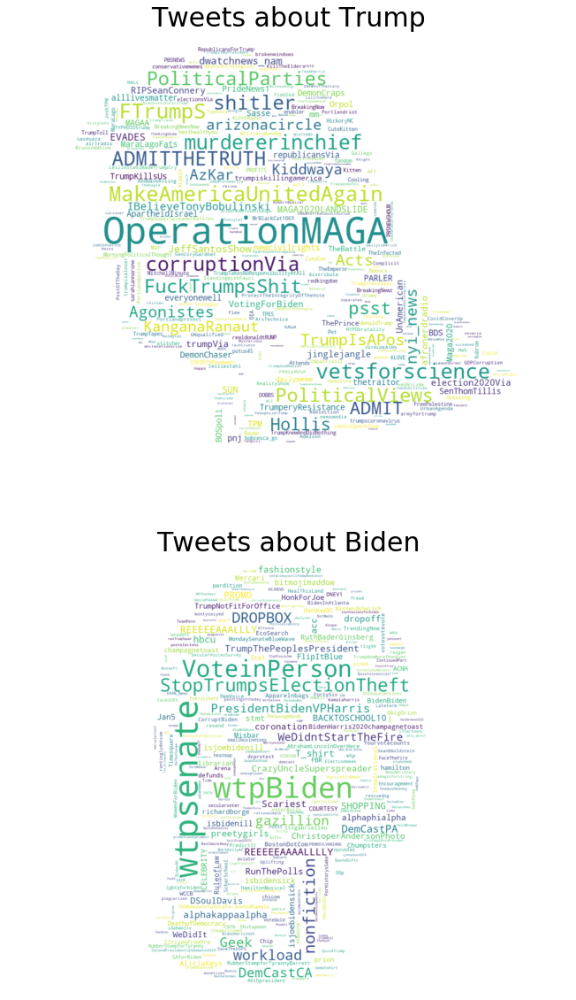

In [ ]:
#Create a list of wordclouds considering TFIDF 

wordcloudsDict = {}
for i in range(len(df_com)):
    index=list(df_com.TFIDF.index)[i]
    comName=df_com['community'][i]
    wordcloudsDict[comName]=wordcloud(df_com.TFIDF[index],comName)
    
wordclouds=list(wordcloudsDict.values())
communityNames=list(wordcloudsDict.keys())

#Print the wordclouds
plotWordclouds(wordclouds,communityNames)

---
The <b> word cloud </b>  of TF-IDF applied to the tweets are shown above. <b> TF-IDF enables to assign a weight to words proportional to their frequency and their specificity for a community. Here the two communities are formed by the users that mainly tweet about Trump and the ones that mainly tweet about Biden.</b>

Firstly, it can be observed that there are more major topics/opinions regarding Trump than Biden. But the few topics regarding Biden are extremely important while their importance for Trump is more shared between the several topics. 

<b> Concerning Trump, voters are really divided. </b> Some strongly support Trump with the word "OperationMAGA" (OperationMakeAmericaGreatAgain). This word is the most important in the word cloud, which means that the support for Trump is consequent. But this supportive expression is also the single one among lots of critics. The major critics about Trump concern the way he dealt with COVID including hashtags like "murderinchief", his unsuccessful mandate with "ADMITTHETRUTH" and potential corruption. Lots of users also bully Trump with words such as "shitler", "FuckTrumpShit" and "FTrump". Some users are more neutral and aim for more unity between both political parties with the hashtags like "MakeAmericaUnitedAgain". 

<b> Concerning Biden, voters mainly agree on major topics and truly support Biden.</b> The Biden community defines itself as the "people". They want the lower and middle class to vote for Biden with hashtags "wtpsenate" (we-the-people-senate) or wtpBiden. They also aim to vote against Trump with "StopTrumsElectionTheft". Finally voting in person is also crucial to avoid any corruption, that Trump is accused of (seen in the wordcloud concerning Trump).

<b> To sump up, the tweets about Biden call for votes for the democratic party while tweets concerning Trump are both supportive and highly critical. </b>

---

# Voters opinion on COVID-19 related to both candidates

---
Democrats and Republicans have different points of view regarding the COVID-19 situation and the way to deal with it. Trump particularly had a controversial way of dealing with it as no measures were first taken because COVID-19 was not considered dangerous by Trump. <b> As the number of cases is extremely high nowadays in the USA, voters are certainly disappointed by Trump's policies. </b>

<b> What do tweets related to COVID-19 say about people's opinions on the way Trump and Biden deal with the pandemic? </b>

--- 

In [ ]:
covidTopics=['Covid19', 
               'coronavirus', 
               'COVID', 
               'covid', 
               'Covid19', 
               'pandemic', 
               'Covid', 
               'Coronavirus', 
               'Pandemic', 
               'TrumpCovid19', 
               'WearAMask', 
               'COVID__19', 
               'SuperSpreader', 
               'Covid_19', 
               'CoronaVirus', 
               'COVIDー19', 
               'COVIDIOTS', 
               'TrumpHasCovid', 
              'TrumpLiedPeopleDied', 
               'GOPSuperSpreaders', 
               'TrumpKnew', 
               'CoronavirusPandemic', 
               'lockdown', 
               'mask', 
               'corona', 
               'Mask', 
               'trumpvirus', 
               'SuperSpreaderTrump', 
               'MaskUp']

In [ ]:
#Add a column with the tweet number 
data1['tweetNb']=data1.index

#Get clean tokens
data1=cleanTokens(data1,'tweet')

#Create a dataframe for tweets related to COVID
data1_covid=data1 
data1_covid=data1_covid[data1_covid.targetedCandidate!="Uncommitted"]

#Select the tweets related to COVID
data1_covid['covidRelated']=data1_covid.hashtags.apply(lambda x: len(set(x)&set(covidTopics)))
data1_covid=data1_covid[data1_covid.covidRelated>0]

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if sys.path[0] == '':


---
<b> The TFTR formula </b>
    
$$ \mathrm{tftr}(t,d) = tf(t,d) \cdot tr(t,d)$$

with 

term frequency: $$  \mathrm{tf}(t,d) = \frac{|t \in d|}{|d|}$$

term ratio: $$  \mathrm{tr}(t,d)= \frac{|t \in d|}{|t \in D: t \notin d| +c}$$

The term frequency used is the same as the one used for the TF-IDF. The term ratio for a word t in document d is the frequency of the word t in the document d divided by the frequency of the word in the other documents.

---

In [ ]:
def TFTR(df,tokens): #Input = Dataframe with a tokens column
    df['TF']=df[tokens].apply(lambda x:dict(FreqDist(x)))
    
    #Create a set of all words with their occurences
    uniqueWords=[list(W.keys()) for W in df['TF']]
    uniqueWords=set(flatten(uniqueWords))
    occurencesAllWords= dict.fromkeys(uniqueWords, 0)
    for row in df['TF']:
        for w,o in dict(row).items():
            occurencesAllWords[w] = occurencesAllWords[w] + o 
        
    #Create the TR distribution for each universe
    df['TR']=df.TF.apply(lambda x: {w:o/(occurencesAllWords[w]-o+1) for w,o in x.items()})
    
    #Create the TF-TR
    df['TFTR']=df.apply(lambda row: {w:(o*dict(row.TR)[w])
                                              for w,o in row.TF.items()},axis=1)
    
    #Drop the unnecessary columns
    df.drop('TF', inplace=True, axis=1)
    df.drop('TR', inplace=True, axis=1)
    
    return df

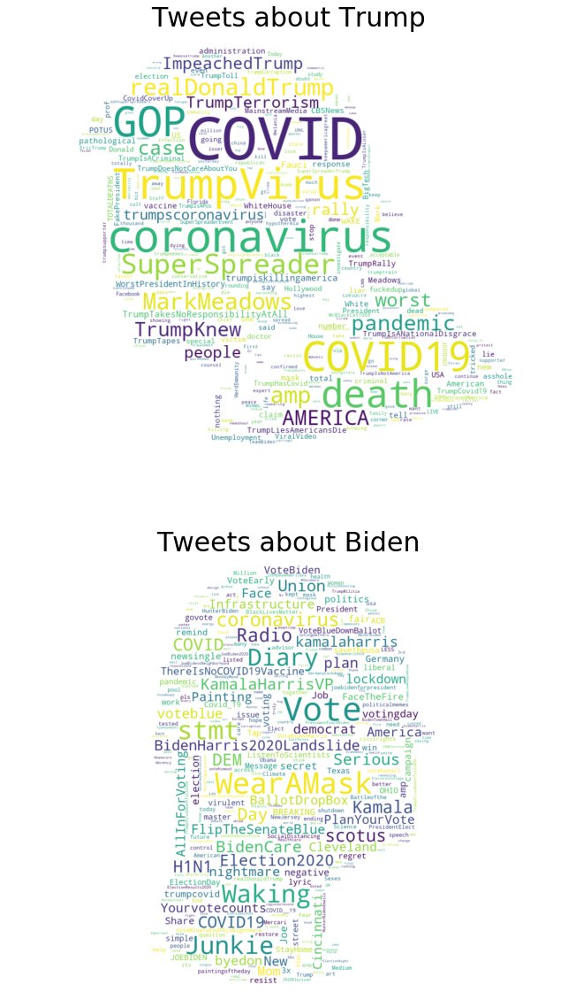

In [ ]:
#Create Trump and Biden partition at the tweet level
tweetsCommunities_covid={row.tweetNb:row.targetedCandidate for (idx,row) in data1_covid.iterrows()}

#Create a dataframe for the communities
df_tweetCom_covid=createCommunityDataframe(data1_covid,tweetsCommunities_covid,"tweetNb")

df_tweetCom_covid=TFTR(df_tweetCom_covid,'tokens')

#Remove the hashtags from the TFTR
df_tweetCom_covid['wordsNotHashtags']=df_tweetCom_covid.TFTR.apply(
                                lambda x: set(x.keys())-set(candidate_cats.keys()))

df_tweetCom_covid['TFTR_no#']=df_tweetCom_covid.apply(lambda x: {w:x.TFTR[w] for w in x.wordsNotHashtags},axis=1)
df_tweetCom_covid=df_tweetCom_covid.drop(["wordsNotHashtags"],axis=1)

#Create a list of 4 wordclouds considering TFTR 
wordcloudsDict = {}
for i in range(len(df_tweetCom_covid.index)):
    index=list(df_tweetCom_covid.index)[i]
    comName=df_tweetCom_covid['community'][i]
    wordcloudsDict[comName]=wordcloud(df_tweetCom_covid['TFTR_no#'][index],comName)
    
wordclouds=list(wordcloudsDict.values())
communityNames=list(wordcloudsDict.keys())

#Print the wordclouds
plotWordclouds(wordclouds,communityNames)

---
<b> The word clouds are based on TF-TR </b>, which assigns a weight to a word considering its frequency in a community relatively to its frequency in both communities. Tweets about COVID-19 are selected to create these word clouds.

The tweets about Trump concern either COVID-19 <b> or accusations about Trump for the current situation.</b> When looking at the main expressions, <b> Trump is considered responsible for deaths, terrorism, killing Americans and overall irresponsibility ("death", "trumpiskillingamerica", "TrumpTerrorism", "TrumpTakesNoResponsabilityAtAll"). </b> That is why, voters make fun of him by calling him "SuperSpreader and "TrumpVirus".

The tweets about Biden calls for "WearAMask". Democrats are therefore associated to a responsible party concerning COVID-19. <b> Tweets about Biden and COVID-19 call for "voting"</b>. "Junkie" also appears a lot. This refers to the answer of Biden to a journalist, that asked if Biden took a cognitive test to assess if his mental health was declining. This last topic is not really related to COVID-19 but still appears in this word cloud. It is more due to the fact that both the junkie episode and COVID-19 requires some kind of testing.

<b>To sum up, Trump badly dealt with COVID-19 and voters are unsatisfied with his actions. On the contrary, Biden proposals concerning COVID-19 has increased the propensity of people voting for his party. Biden finally benefits from the COVID-19 situation while Trump lost a lot of credibility. </b>
    
    

---

### Sub Conclusion

The analysed **bipartite graph** is not random as user's and hashtag's degrees follow a **scale-free distribution**. Thus, some hashtags, relating to Trump, Biden, the election2020 but also COVID-19, play a major role in the 2020 election while some hashtags are minor. The users also have **different behaviour on Twitter**. Some tweet a lot while others do not. Some express their actual opinions while others trash-talk the candidates.

By analysing the **word clouds**, the opinions regarding Trump are mixed. Some voters strongly support him with hashtags such as "MakeAmericaGreatAgain", while others strongly criticize him with hashtags such as "FuckTrumpShit". On Biden's side, tweets mainly agree on supporting him. The voters supporting him define themselves as the people with hashtags such as "wtpBiden" (we-the-people-Biden). Tweets about COVID-19 divide even more users. Trump is seen as the responsible for deaths while Biden is strongly supported. COVID-19 is therefore a topic which benefits Biden and has a negative impact on Trump's results during the 2020 election.

# 4. Sentiment Analysis


---

In this part we are going to use **Machine Learning** to identify the **sentiment** of the tweets! More specifically, we are going to use the Sentiment140 dataset which contains 1.6 million labeled tweets! Wow someone sat a lot of hours in front of a computer! The dataset can be downloaded [here](http://cs.stanford.edu/people/alecmgo/trainingandtestdata.zip)

The **sentiment** can help us identify the supporters of the caniditates. Once we have that, we can compare the **user behaviour** based on the sentiment with the actual election results! 😎 Could the election results have been predicted by doing this analysis?🤔

Let's start by importing some dependecies and defining some useful functions!

---

In [ ]:
# utilities
import re
import numpy as np
import pandas as pd
import string
# plotting
import seaborn as sns
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# nltk
from nltk.stem import WordNetLemmatizer
import nltk
from nltk.corpus import stopwords
# sklearn
from sklearn.svm import LinearSVC
from sklearn.naive_bayes import BernoulliNB
from sklearn.linear_model import LogisticRegression

from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics import confusion_matrix, classification_report

wn = nltk.WordNetLemmatizer()
ps = nltk.PorterStemmer()
cached_stopwords=stopwords.words('english')

remove_hashtags=lambda x: ' '.join(re.sub("(#[A-Za-z0-9]+)|([^0-9A-Za-z \t])|(\w+:\/\/\S+)"," ",x).split())

# removes hashtags mentions links and puncuation! 
regex_magic= lambda x: ' '.join(re.sub("(#[A-Za-z0-9]+)|(@[A-Za-z0-9]+)|([^0-9A-Za-z \t])|(\w+:\/\/\S+)"," ",x).split())
regex_notso_magic= lambda x: ' '.join(re.sub("([^0-9A-Za-z \t])|(\w+:\/\/\S+)"," ",x).split())
#TEXT CLEANING FUNCTION
def clean_text(text):
    text=regex_magic(text).lower()
    text= re.sub('[0-9]+', '', text)#removed numbers
    tokens = re.split('\W+', text)    # tokenization
    text = [ps.stem(word) for word in tokens if word not in cached_stopwords]  # remove stopwords and stemming
    text = [wn.lemmatize(word) for word in text]
    return text

#functions for printing the results of the Model
def model_Evaluate(model):
    
    # Predict values for Test dataset
    y_pred = model.predict(X_test)

    # Print the evaluation metrics for the dataset.
    print(classification_report(y_test, y_pred))
    
    # Compute and plot the Confusion matrix
    cf_matrix = confusion_matrix(y_test, y_pred)

    categories  = ['Negative','Positive']
    group_names = ['True Neg','False Pos', 'False Neg','True Pos']
    group_percentages = ['{0:.2%}'.format(value) for value in cf_matrix.flatten() / np.sum(cf_matrix)]

    labels = [f'{v1}\n{v2}' for v1, v2 in zip(group_names,group_percentages)]
    labels = np.asarray(labels).reshape(2,2)

    sns.heatmap(cf_matrix, annot = labels, cmap = 'Blues',fmt = '',
                xticklabels = categories, yticklabels = categories)

    plt.xlabel("Predicted values", fontdict = {'size':14}, labelpad = 10)
    plt.ylabel("Actual values"   , fontdict = {'size':14}, labelpad = 10)
    plt.title ("Confusion Matrix", fontdict = {'size':18}, pad = 20)

---
Load and clean the text from hashtags, mentions, puncuation, numbers and then stemming and lemmatizing.

### The Text Cleaning Process 
* Regural expresions are used to filter out the **#hashtags, @mentions, punctuation, numbers and URLS**. The mentions and hastags are removed because they will not be of relevance since we are training the model on general Twitter data. More specificaly:
    * (#[A-Za-z0-9]+) : removes hashtags
    * (@[A-Za-z0-9]+) : removes mentions
    * ([^0-9A-Za-z \t]) : removes punctuations 
    * (\w+:\/\/\S+) : removes links
    * ([0-9]+) : removes numbers
    
    All of the above are joined into a string with | as joint and are used with re.sub(). The result is the function in the above code cell called **'regex_magic'** that is used with apply in the pandas dataset.
    
    
* After the cleaning the text is tokenized using re.split('\W+', text) which is pretty fast!
* Then stemming is followed using the **PorterStemer** from **NLTK**
* Finally lemmatization using NLTK's **WordNetLemmatizer** 

All of the above are into a function called clean_text that can be used with pd.Series.apply() which is very handy!
    
---

#### Preparing the dataset

In [ ]:
# Importing the dataset
sent140 = pd.read_csv(r"C:\Users\Ben\Desktop\Social Graphs and Interactions\__Final Project__\Data Proofs\trainingandtestdata\sentiment140.csv",
                      encoding="ISO-8859-1" , names=["sentiment", "ids", "date", "flag", "user", "text"])
#taking the columns that we need
sent140 = sent140[['sentiment','text']]
sent140['sentiment'] = sent140['sentiment'].replace(4,1)
#preprocessing the text
sent140['text_clean']=sent140.text.progress_apply(clean_text)
sent140['text_clean_join']=sent140.text_clean.progress_apply(lambda x: ' '.join(x))

#### Spliting the train, test sets and converting the text into vectors

---
Splitting the data into train and test sets, transforming the text into a vector with the help of **TfidfVectorizer**.

The best performing models were found to be **SVC** and **Linear Regression**. After testing, it was proven that **Linear Regression** has a slight edge so we chose this one.


The model performs well enough with an **80% accuracy** and **76% recall** for the negative class and **81%** for the positive! Results are not class leading by any means but they are good enough for the purpose of this project. 

---

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(sent140['text_clean_join'],
                                                    sent140.sentiment,
                                                    test_size = 0.05, random_state = 42)
word2vec = TfidfVectorizer(ngram_range=(1,2), max_features=50000)
word2vec.fit(X_train)
X_train = word2vec.transform(X_train)
X_test  = word2vec.transform(X_test)

#### Training the Model

              precision    recall  f1-score   support

           0       0.80      0.76      0.78     39999
           1       0.77      0.81      0.79     40001

    accuracy                           0.79     80000
   macro avg       0.79      0.79      0.79     80000
weighted avg       0.79      0.79      0.79     80000



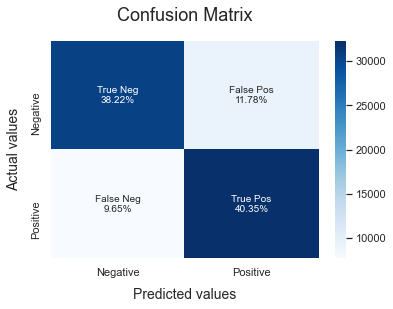

In [ ]:
#Linear SVC
clf = LogisticRegression(C=2,n_jobs=-1,max_iter=10000)
#Train the model
clf.fit(X_train, y_train)
model_Evaluate(clf)

#### Predicting the Sentiment of Tweets for our dataset

---
Here a function **get_sentiment** is defined to get the **sentiment** of our tweets. Before this, we need to process our tweets in the same way that we did with the train set. Additionaly, a **confidence threshold** is added for the neutral tweets. Basically tweets with sentiment between -0.2 and 0.2 are considered neutral in sentiment since the model is performing only at 80% and not higher, we need a fail safe. After that we get the sentiment for our tweets! 

---

In [ ]:
# Getting the sentiment of the Tweets
def get_sentiment(text):
    text=word2vec.transform([text])
    neg,pos=clf.predict_proba(text)[0]
    if neg>.6:
        sentiment='Negative'
    elif pos>.6:
        sentiment='Positive'
    else:
        sentiment='Netural'
    return neg,pos,sentiment

list2doc=lambda x: ' '.join(x)
raw['tweet_processed']=raw['tweet'].progress_apply(lambda x: list2doc(clean_text(x)))
raw['sentiment_scores']=raw.tweet_processed.progress_apply(get_sentiment)

### Normalizing the confidence/polarity of the predictions 

---
Polarity introduction, the probability scores of the model are in the range of 0-1, both the most positive and negative tweet will get the value 1, since that metric is just the confidence of the prediction. At the cell below a normalization function is introduced which assigns -1 to most negative tweet and +1 to the most possitive one. 

---

In [ ]:
# claculating and normalizing the polarity or in other words the confidence of the model's prediction
pos=raw.sentiment_scores.apply(lambda x: x[1]).tolist()
neg=raw.sentiment_scores.apply(lambda x: x[0]).tolist()
pos_max=max(pos)
pos_min=min(pos)
def normalize_polarity(x):
    avg=(pos_max+pos_min)/2
    ran=(pos_max-pos_min)/2
    return (x-avg)/ran
raw['polarity']=raw.sentiment_scores.progress_apply(lambda x: normalize_polarity(x[1]))

### Indentifying which candidate the User supports based on their Sentiment towards them

---
Now we have reached a big milstone! Here the sentiment of the user towards each candidate is computed. How it works is pretty simple! Since we know for each user, who they mostly tweet about, now we can add the sentiment into the mix and see if they have a positive or negative sentiment towards that candidate. By doing this, we assume that it is a good indication of voter's behaviour. For example, if you mostly talk about Trump with a negative sentiment, most likely you are going to vote for Biden. If you talk mostly about Trump with a positive sentiment then you are most likely going to vote for him. So finally, under these assumptions, we are going to try and see if there is any correlation between our prediction and the real election results!

Summing up the process:
1. If a User tweets mostly about a candidate and their overall sentiment towards that candidate is positive, they support him
2. If they don't, they most likely support the other candidate.

Assumtion: If a User has negative collective sentiment towards a candidate, then the user must support the other candidate. 

---

In [ ]:
supporters_view=raw.pivot_table(index='user_screen_name',columns='tweets_about',values='polarity',aggfunc='sum')[['Biden','Trump']]
inds = supporters_view[["Biden", "Trump"]].isnull().all(axis=1) 
supporters_view=supporters_view.loc[~inds, :]
supporters_view=supporters_view.fillna('na')
def f_biden(x):
    if type(x)==float:
        if x>0:
            return 'Biden'
        else:
            return 'Trump'
        
def f_trump(x):
    if type(x)==float:
        if x>0:
            return 'Trump'
        else:
            return 'Biden'
supporters_view['supports']=supporters_view.Biden.apply(f_biden)
supporters_view['supports1']=supporters_view.Trump.apply(f_trump)
supporters_view.supports=supporters_view.supports.fillna('')
supporters_view.supports1=supporters_view.supports1.fillna('')
supporters_view['supports']=supporters_view.supports.astype(str)+supporters_view.supports1.astype(str)
supporters_view=supporters_view.drop(columns='supports1')
voter_mapping=supporters_view['supports'].to_dict()
raw['supports']=raw.user_screen_name.map(voter_mapping)
raw.supports=raw.supports.fillna('Uncommited')

---
After the calulations we have the following information, in the column 'supports' meaning who they support. You can see that there are cases were users are tweeting mostly about one candidate but in a negative way! How many can they actually be??🤔

---

In [ ]:
supporters_view.sample(5)

tweets_about,Biden,Trump,supports
user_screen_name,,,
ShawnSpeakman,na,0.523159,Trump
Tu_Chupas_Pinga,na,-0.290143,Biden
williamnoonan,-1.86021,na,Trump
StephenH2OMan,0.328132,na,Biden
Sarastapleton12,na,0.473193,Trump


### Sentiment of Tweets towards the candidates

---
It seems like more than half of the people who talk about Trump are tweeting negatively about him, most likely Biden supporters. Also, it seems like there is a lot of trash-talking going on! Same can be said for Biden but we have much higher positive sentiment for him. That is probably because of the 7th of November when the results of the election were annoucned. We have to make sure we only look to the dates before the election in order for our predictions to make any sense and not be biased.

---

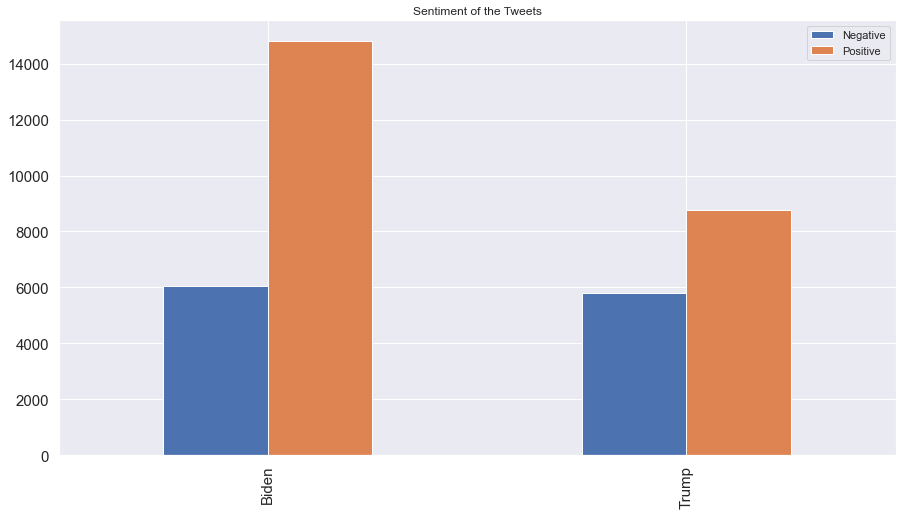

In [ ]:
biden_negative_count=supporters_view[supporters_view.Biden.replace('na',0)<0].shape[0]
biden_positive_count=supporters_view[supporters_view.Biden.replace('na',0)>0].shape[0]
trump_negative_count=supporters_view[supporters_view.Trump.replace('na',0)<0].shape[0]
trump_positive_count=supporters_view[supporters_view.Trump.replace('na',0)>0].shape[0]
pd.DataFrame(data=[[biden_negative_count,biden_positive_count],[trump_negative_count,trump_positive_count]],
            columns=['Negative','Positive'],index=['Biden','Trump']).plot.bar(title='Sentiment of the Tweets',
                                                                             figsize=(15,8),fontsize=15);

### Correlation between Election results and Twitter Sentiment results.

---
We have now reached a point where we can answer one of our big questions. Can the election results be predicted from the sentiment of the Tweets towards the candidates? 
The following plots are made for the tweets that are done before the 3rd of November (election date). We have three plots:
* First plot is represented by who the user mostly talks about
* Second plot takes the sentiment analysis in consideration that was explained above
* Third is the actual elections results

Now take a look at the first two states where we had the most Twitter acivity, **California and New York**. If we had only taken what users mostly talk about under consideration, we would have made a wrong prediction. On the flip side, taking a look at the second plot which is, based on the sentiment, we can see that the prediction is actually correct! 


But... how many of the states can we actually predict correctly? 🤔

---

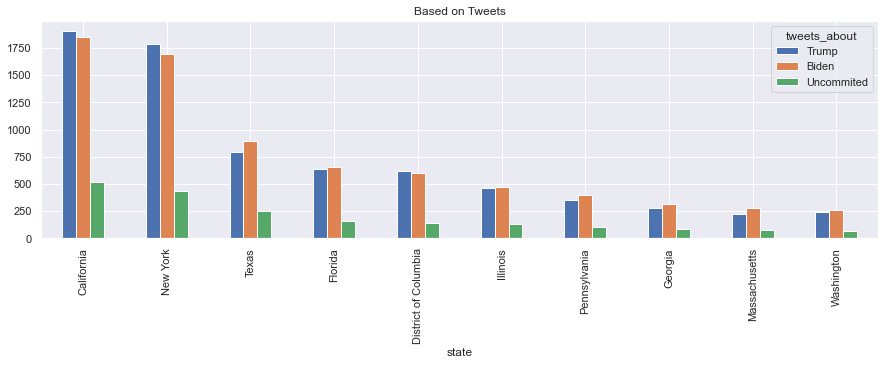

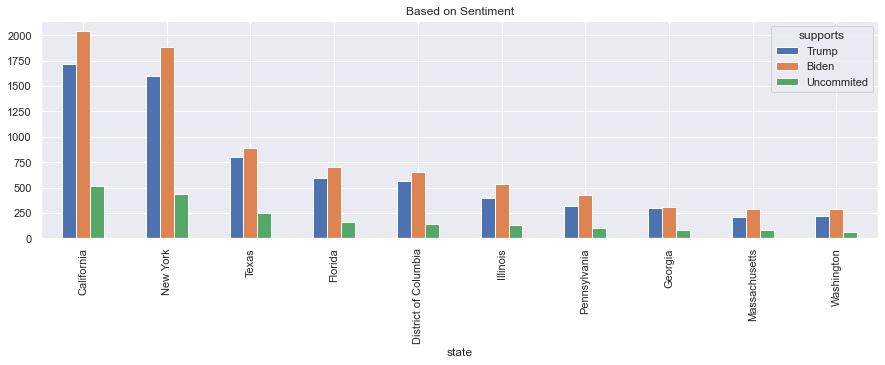

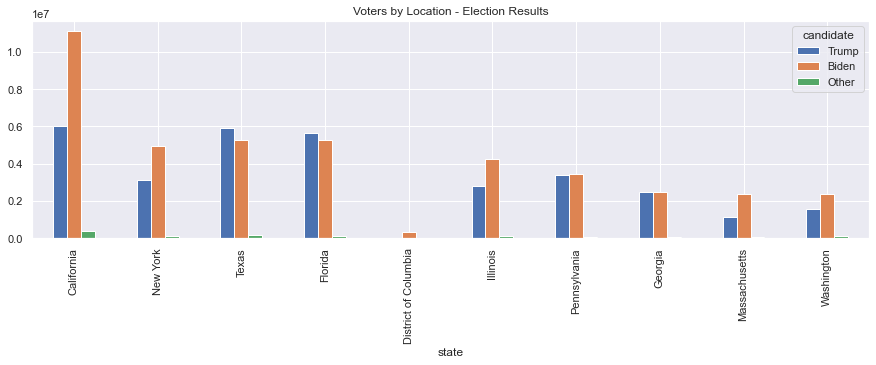

In [ ]:
# BEFORE ELECTION
el_results=pd.read_csv(r"C:\Users\Ben\Desktop\Social Graphs and Interactions\__Final Project__\Analysis\election_results\president_county_candidate.csv")
el_results.candidate=el_results.candidate.map({'Joe Biden':'Biden',
                          'Donald Trump': 'Trump'}).fillna('Other')
el_resultsv=el_results.pivot_table(index='state',columns='candidate',values='total_votes',aggfunc='sum')
el_resultsv=el_resultsv[['Trump','Biden','Other']]


view1=raw.loc[:'2020-11-02'].pivot_table(columns='tweets_about',index='state',values='user_screen_name',aggfunc=lambda x: len(x.unique()))
view1['total']=view1.sum(axis=1)
view1.sort_values(by='total',ascending=False)[['Trump','Biden','Uncommited']]\
.head(10).plot.bar(figsize=(15,4),title='Based on Tweets');


view1=raw.loc[:'2020-11-02'].pivot_table(columns='supports',index='state',values='user_screen_name',aggfunc=lambda x: len(x.unique()))
view1['total']=view1.sum(axis=1)
view1.sort_values(by='total',ascending=False)[['Trump','Biden','Uncommited']]\
.head(10).plot.bar(figsize=(15,4),title='Based on Sentiment');



el_resultsv.loc[['California', 'New York', 'Texas', 'Florida',
       'District of Columbia', 'Illinois', 'Pennsylvania', 'Georgia',
       'Massachusetts', 'Washington']].plot.bar(figsize=(15,4),title='Voters by Location - Election Results');

---
Now this is promising! Based on the sentiment of the tweets and all the above analysis, we could have predicted the actual result of the 2020 election in **29 out of 50 states!** This is not by any means perfect, but keep in mind that the data is far from big and also not representative for every state in terms of Twitter user per state population. Not having a representative amount of tweets means that the prediction can lean to either side. Nonetheless, it is an interesting approach on predicting the election and may prove to be promising on bigger and more well representive datasets. 

In this particular case for the **top 10 states** the prediction is **8/10!** Seems like we are going to be busy in 2024 for the next elections! 😄 


---

In [ ]:
# counting the times the prediction was correct 
el_resultsv.loc[el_resultsv.Trump>el_resultsv.Biden,'winner_actual']='Trump'
el_resultsv.loc[el_resultsv.Trump<el_resultsv.Biden,'winner_actual']='Biden'
pred_view=raw.loc[:'2020-11-2'].pivot_table(index='state',columns='supports',values='user_screen_name',aggfunc=lambda x: len(x.unique()))
pred_view.loc[pred_view.Trump>pred_view.Biden,'winner_pred']='Trump'
pred_view.loc[pred_view.Trump<pred_view.Biden,'winner_pred']='Biden'
predval_view=pd.concat([pred_view,el_resultsv],axis=1)
correct_predictions=predval_view[(predval_view.winner_pred==predval_view.winner_actual)].shape[0]
print('Correct Prediction of Electorial Results per state: ',correct_predictions,' out of 50 States.')

Correct Prediction of Electorial Results per state:  29  out of 50 States.


### Sentiment per Candidate before and after the election

---
Some extra interesting plots! The first plot is before the election and the second one is after.
What is interesting here is that before the election the most negative sentiment is generated from Biden supporters towards Trump. After the election, especially when the results were announced, we see that the relative negative activity drops and most people are tweeting positively about Biden, mostly to congratulate him.

Here, it would be very intersting to compare the same graphs after Trump did not concede, it is expected that the negative sentiment for him would increase.

As a general, take away from this graph we can see that we have a lot of overlapping of negative sentiment towards both sides. This is apparent throughout the whole project, but we can see it clearly here from the amount of negative tweets that are made for either candidate.

---

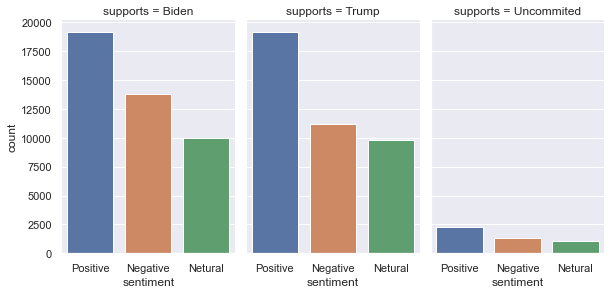

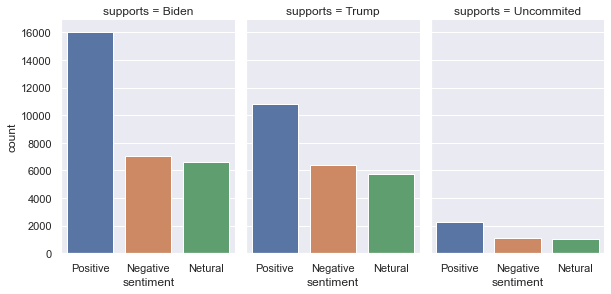

In [ ]:

before=sns.catplot(x="sentiment",  col="supports",col_order=['Biden','Trump','Uncommited'],
                data=raw.loc[:'2020-11-2'], kind="count",
                height=4, aspect=.7,order=['Positive','Negative','Netural']);
after=sns.catplot(x="sentiment",  col="supports",col_order=['Biden','Trump','Uncommited'],
                data=raw.loc['2020-11-3':'2020-11-9'], kind="count",
                height=4, aspect=.7,order=['Positive','Negative','Netural']
               )


### Sentiment over time

---
And just for fun let us plot the sentiment trend over time. Firstly, it is apparent that there is a big increase at the end of the plot for the positive tweets about Biden's victory. After Biden's victory, we can see the negative tweets for him are dropping. It seems like Trump's supporters took a break on trash-talking Biden! Other than that, the sentiment for either side seems to be moving with the same trend. What is worth noting, is the high amount of negative activity.

---

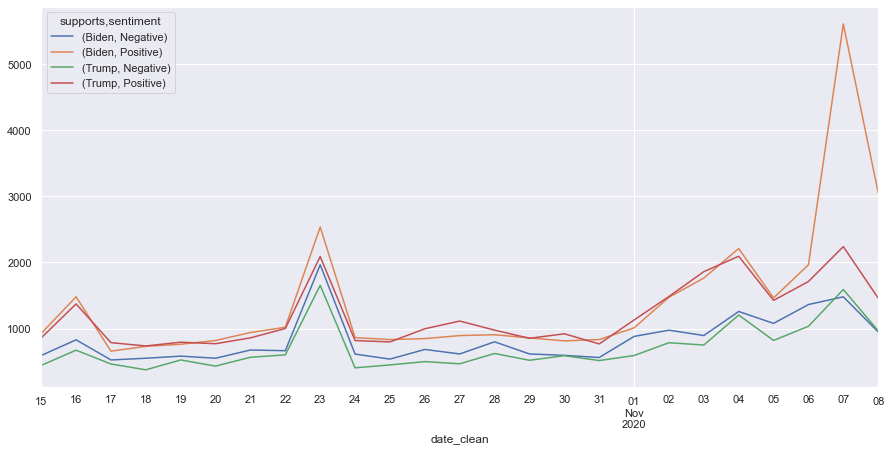

In [ ]:
raw[(raw.supports!='Uncommited')&(raw.sentiment!='Netural')]\
.pivot_table(columns=['supports','sentiment'],aggfunc='count',values='user_screen_name',index='date_clean')\
.resample('d').sum().plot(figsize=(15,7));


##  Word clouds based on Sentiment

---
The word clouds are based on TF-IDF. Then the sentiment is used to filter out the data into groups, Negative and Positive for each candidate. This way we can see how people talk about Trump or Biden positively or negatively. In addition, the hashtags are removed in order to keep only the text information of the tweet. The TF-IDF definitions are included in part 2 so they will not be repeated here.


---

In [ ]:
import nltk
nltk.download('wordnet')
#!pip install langid
from tqdm import tqdm
from tqdm.notebook import tqdm_notebook 
tqdm_notebook.pandas()
import string
from sklearn.feature_extraction import stop_words
from nltk.stem import WordNetLemmatizer 
lemmatizer = WordNetLemmatizer()
import pandas as pd
from nltk.corpus import stopwords
from wordcloud import WordCloud
import numpy as np
from nltk import RegexpTokenizer
from nltk import word_tokenize
from nltk.probability import FreqDist
import re
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('punkt')
#cleaning tokens
cached_stopwords=stopwords.words('english')
## FUNCTIONS DEFINITIONS ##

#cleaning tokens
flatten = lambda t: [item for sublist in t for item in sublist]


wn = nltk.WordNetLemmatizer()
ps = nltk.PorterStemmer()
sb = nltk.SnowballStemmer('english')

regex_magic= lambda x: ' '.join(re.sub("(#[A-Za-z0-9]+)|(@[A-Za-z0-9]+)|([^0-9A-Za-z \t])|(\w+:\/\/\S+)"," ",x).split())
regex_notso_magic= lambda x: ' '.join(re.sub("([^0-9A-Za-z \t])|(\w+:\/\/\S+)"," ",x).split())

cached_stopwords=stopwords.words('english')
extra_stop_words=['I','amp','The','We','You','It','u','if','This','via','A','in']
cached_stopwords.extend(extra_stop_words)
#tokeniing and cleanign 
tokenizer = RegexpTokenizer(r"\w+")
def tokenize_clean(text):

    tokens_no_punctuation = tokenizer.tokenize(text)
    tokens_clean = [sb.stem(wn.lemmatize(word)) for word in tokens_no_punctuation 
                         if not word in cached_stopwords]
    return tokens_clean

# compting TFIDF
def compute_tfidf(df,text):
    
    #text = [ps.stem(word) for word in tokens if word not in cached_stopwords]  # remove stopwords and stemming
#     text = [wn.lemmatize(word) for word in text]
    
    df['tokens']=df[text].progress_apply(lambda x: x.lower())
    df['tokens']=df['tokens'].progress_apply(regex_magic)
    df['tokens']=df['tokens'].str.replace('[0-9]+', '',)
    df['tokens']=df['tokens'].progress_apply(tokenize_clean)

    #Compute term frequencys for all words 
    print('Computing Word Frequencies..')
    df['TF']=df['tokens'].progress_apply(lambda x:dict(FreqDist(x)))   
    
    #Create a set of all words with the number of document they occur in
    uniqueWords=[list(W.keys()) for W in df['TF']]
    uniqueWords=set(flatten(uniqueWords))
    occurencesAllWords= dict.fromkeys(uniqueWords, 0)
    for row in df['TF']:
        for w,o in dict(row).items():
            #The word w is counted once if it appears in the document corresponding to row
            occurencesAllWords[w] = occurencesAllWords[w] + min(1,o) 
    
    #Compute the idf-weight for each word
    N=df.shape[0] #Number of documents
    idf={w:np.log(N/o) for w,o in occurencesAllWords.items()}
    
    #Compute the TF-IDF
    print('Computing TF-IDF..')
    df['TFIDF']=df.TF.progress_apply(lambda x: {w:o*idf[w] for w,o in x.items()})
    
    return df



#aggregating the words and the scores from the reviews 
def get_words(temp, TFIDF):
    keys=flatten(temp[TFIDF].apply(lambda x: x.keys()))
    val=flatten(temp[TFIDF].apply(lambda x: x.values()))
    sent=pd.DataFrame(list(zip(keys, val)),columns=['words','score']).groupby('words').sum()
    sent=sent.sort_values(by='score',ascending=False).reset_index()
    return sent



[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\Ben\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
C:\Users\Ben\anaconda3\envs\Twitter_Project\lib\site-packages\tqdm\std.py:699: FutureWarning: The Panel class is removed from pandas. Accessing it from the top-level namespace will also be removed in the next version
  from pandas import Panel
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Ben\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\Ben\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Ben\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [ ]:
raw=compute_tfidf(raw,'tweet')


Computing Word Frequencies..



Computing TF-IDF..


#### Ploting the Word Clouds


Below, the word clouds present how Twitter users tweet about the two presidential candidates (excluding hashtags). On the negative side, words like "lose", "sad" and "fail" are evident in both word clouds with different weights. As expected these words have a heavier weight on the Trump side than Biden since he ended up losing the election. Furthermore, it is interesting to see that words like "death", "kill" and "die" are present in the negative word cloud for Trump and not in Biden's. This might have a link to the response of how Trump handled the COVID-19 situation in America as explained in part 2.


On the positive side, words like "love", "thank", and "good" are again displayed in both word clouds. Strikingly, the word "vote" is prominent in both word clouds. This shows that whether the users speak positively about Trump or Biden, they all agree that voting is important.

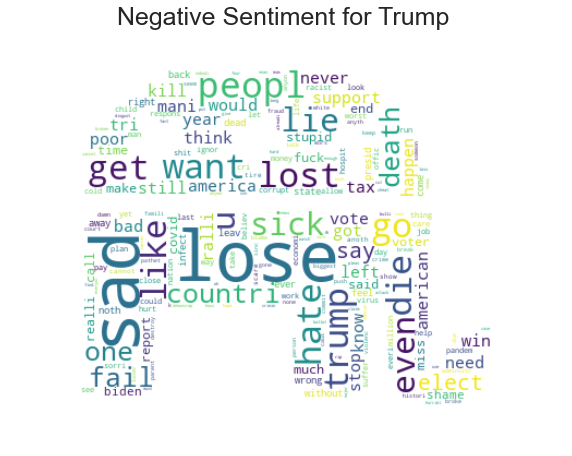

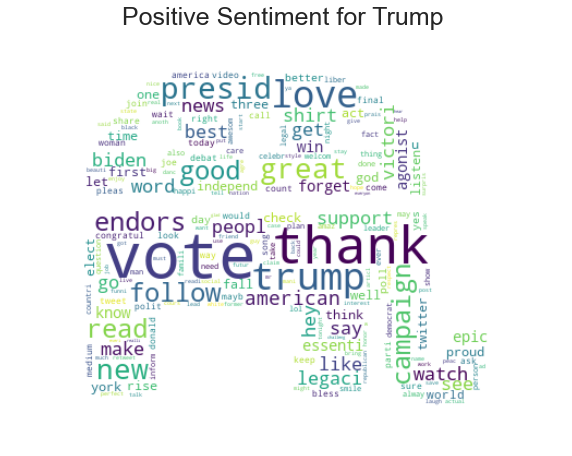

In [ ]:
from PIL import Image
donkey= np.array(Image.open("./donkey.png"))
elephant= np.array(Image.open("./elephant_hr.jpg"))
#ploting wordclouds
def plot_wordcloud(temp,tfidf,title,mask):
    word_dict=get_words(temp,tfidf).set_index('words')['score'].to_dict()
    wc = WordCloud( max_words = 200, width = 1024, height = 512,
                    background_color = "white", collocations = False,mask=mask)
    wc.generate_from_frequencies(word_dict)
    svg_text = wc.to_svg()
    with open(f'./svgs/{title}without_hashtag.svg', 'w') as f:
        f.write(svg_text)
    plt.figure(figsize=(10,10))
    plt.title(title,fontsize=25)
    plt.imshow(wc, interpolation='bilinear')
    plt.axis("off")
    plt.show()
    
confidence=.7
neg_for_trump=raw[(raw.sentiment=='Negative')&(raw.tweets_about=='Trump')&(raw.polarity<-confidence)]
pos_for_trump=raw[(raw.sentiment=='Positive')&(raw.tweets_about=='Trump')&(raw.polarity>confidence)]


plot_wordcloud(neg_for_trump,'TFIDF','Negative Sentiment for Trump ',mask=elephant)

plot_wordcloud(pos_for_trump,'TFIDF','Positive Sentiment for Trump ',mask=elephant)



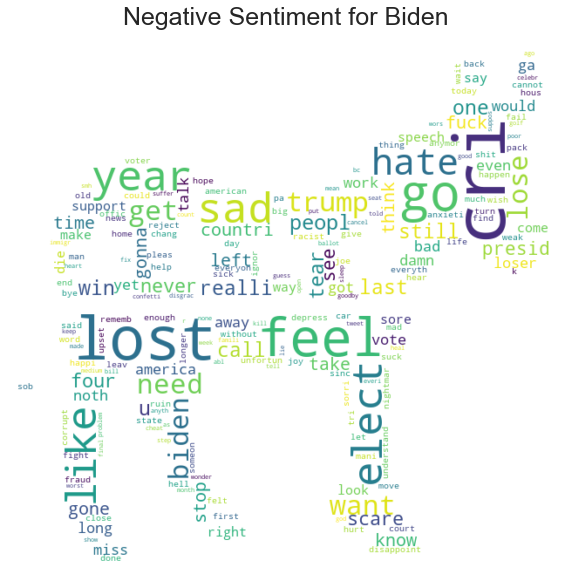

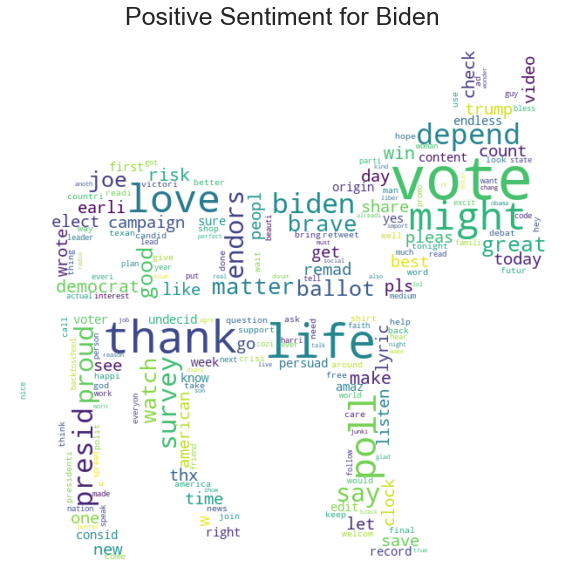

In [ ]:
confidence=.7
neg_for_biden=raw[(raw.sentiment=='Negative')&(raw.tweets_about=='Biden')&(raw.polarity<-confidence)].loc['2020-11-6':]
pos_for_biden=raw[(raw.sentiment=='Positive')&(raw.tweets_about=='Biden')&(raw.polarity>confidence)].loc[:'2020-11-6']
plot_wordcloud(neg_for_biden,'TFIDF','Negative Sentiment for Biden',mask=donkey)
plot_wordcloud(pos_for_biden,'TFIDF','Positive Sentiment for Biden ',mask=donkey)

### Lexical Diversity 

---
**Lexical diversity** is the ratio between how many unique words there are in a text divided by the length of that text. That means that a lower ratio will indicate fewer words being repeated hence a more rich vocabulary. The opposite is true if the ratio is high.

Now, let us compare the **lexical diversity** of Trump vs Biden supporters as well as positive and negative tweets in general. To do this the following steps were implemented:

1. Defining a function that calculates the lexical diversity
2. Calculating the lexical diversity for every processed tweet with no hashtags
3. Splitting the dataset into Trump and Biden supporters and averaging the tweets
4. Similarly for negative and positive tweets

---

In [ ]:
# functions that calcualtes lexical divercity
def lexical_diversity(text): 
    if len(text)!=0:
        return len(set(text)) / len(text)
    else:
        return None
    
raw.tweet_processed=raw.tweet_processed.apply(lambda x: x.lower())
raw['lexical_diversity']=raw.tweet.progress_apply(lexical_diversity)
ld_trump=raw[(raw.lexical_diversity.notna())&(raw.supports=='Trump')].lexical_diversity.mean()
ld_biden=raw[(raw.lexical_diversity.notna())&(raw.supports=='Biden')].lexical_diversity.mean()
ld_neg=raw[(raw.lexical_diversity.notna())&(raw.sentiment=='Negative')].lexical_diversity.mean()
ld_pos=raw[(raw.lexical_diversity.notna())&(raw.sentiment=='Positive')].lexical_diversity.mean()

---
Two things are apparent from the follwing results, positive tweets generally use less lexical diversity than negative ones. Seems like people are more creative with their vocabulary when they talk negatively. The second thing is that Trump supporters have a slightly higher score than Biden supporters. That means that Biden supporters generally use a slightly richer vocabulary in comparison to Trump supporters.

---

In [ ]:
print('Lexical Diversity of Trump Supporters: %.3f'%ld_trump)
print('Lexical Diversity of Biden Supporters: %.3f'%ld_biden)
print('Lexical Diversity of Negative Tweets:  %.3f'%ld_neg)
print('Lexical Diversity of Positive Tweets:  %.3f'%ld_pos)

Lexical Diversity of Trump Supporters: 0.264
Lexical Diversity of Biden Supporters: 0.259
Lexical Diversity of Negative Tweets:  0.238
Lexical Diversity of Positive Tweets:  0.279


### Sub-Conclusion

Sentiment analysis can be powerful additional information to Twitter data that opens up different posibilities for insights. Firstly, the Machine Learing model predicts the sentiment of the tweets with 80% accuracy. Since there is an abundance of tweets available to scrape the inaccuracy of the remaining 20% can be compensated by filtering out the ones where the confidence level is high. So by doing this we can predict the sentiment of the tweets accurately. Making predictions about elections from Twitter comes with certain assumptions and limitations. The results of this project show that it is possible up to a certain extent but more research needs to be done in order to give more solid conclusions. 

As far as the general sentiment analysis goes, it was shown that the ratio between negative and positive tweets is high. Meaning that for every two positive tweets there is atleast one negative. Furthermore, there is a big overlap between negative sentiment towards the opposing side. Combining it with the findings from the previous parts, it means that users on Twitter mostly tweet about supporting their candidate of choice or talk down on the opposing side. There was no indicated activity on important topics like education, economy or healthcare. 

It was also shown that Biden supporters had a higher negative sentiement, presumably towards Trump, before the election results were publised. After the election results, the relative sentiment dropped for both sides except for the positve sentiment for Biden. What is noteworthy here is that both supporting sides dropped the relative negative activity towards the opposing side after the election results.



# 5. Conclusion

###What went well?

Throughout the project findings, we have succeeded in answering our three main questions. 

From the analysis of the dataset, it is evident that Twitter data can generate some interesting insights. Firstly, we saw that there are more users that tweet about Biden rather than Trump, but on the other hand there are more tweets regarding Trump. Also, from the hashtag analysis, it seems like people are not talking about topics like education, economy or healthcare but they mostly support or oppose the candidates.

The analysed bipartite graph is not random as user's and hashtag's degrees follow a scale-free distribution. The users also have different behaviour on Twitter. Some tweet a lot while others do not. Some express their actual opinions while others trash-talk the candidates.

By analysing the word clouds, the opinions regarding Trump are mixed. Some voters strongly support him while others strongly criticize him. On Biden's side, tweets mainly agree on supporting him. COVID-19 is a topic which benefits Biden and has a negative impact on Trump's results during the 2020 election.

As far as the general sentiment analysis goes, it was shown that the ratio between negative and positive tweets is high. Furthermore, there is a big overlap between negative sentiment towards the opposing side. Combining it with the findings from the previous parts, it means that users on Twitter mostly tweet about supporting their candidate of choice or talk down on the opposing side.

###What is missing?/Improvements

Having a look at the opinions through the word clouds for other topics than COVID-19, such as education, economy etc. would have provided more insights regarding opinions of voters related to Trump and Biden. Using the demographic data to analyse the word clouds for voters in some specific states and comparing them with the results in each state would also have been interesting.

As mentioned, the Machine Learing model predicts the sentiment of the tweets with 80% accuracy. Since there is an abundance of tweets available to scrape the inaccuracy of the remaining 20% can be compensated by filtering out the ones where the confidence level is high. So by doing this we can predict the sentiment of the tweets accurately. Making predictions about elections from Twitter comes with certain assumptions and limitations. The results of this project show that it is possible up to a certain extent but more research needs to be done in order to give more solid conclusions. In addition, a larger dataset would have been helpful and beneficial in facilitating the findings.




# 6. Contributions
* Gauthier Belpaire, s193640: Network Analysis
* Iman Chelhi, s165228: Website, Data Cleaning, Word Clouds
* Veniamin Tzingizis, s192851: Data Collection & Cleaning and Prelimenary Analysis, Sentiment Analysis


# Apendix


#### Data cleaning

In [ ]:
# DATA CLEANING
# read some dataset that were merged before 
# these datasets has been merged and lightly cleaned in previous notebook
# the code on those is not include in order to keep this notebook short and get to the point
df1235=pd.read_pickle('./merge1235.pickle') # some dirty merged data checkpoint
df4=pd.read_pickle('./df4_dirty.pickle')  # some other dirty data checkpoint
df4=df4[df4.user.notna()]
# Transformign the string dict of the Stantard Twitter 'user' field 
# into a Python dictonary  
import ast
def user_clean(df,user_dict_str):
    """
    user_dict_str: the defualt user dictonary from Twitter API
    """
    df['user_dict']=df[user_dict_str].progress_apply(ast.literal_eval)
    df['user_id']=df.user_dict.progress_apply(lambda x: x['id'])
    df['user_name']=df.user_dict.progress_apply(lambda x: x['name'])
    df['user_scren_name']=df.user_dict.progress_apply(lambda x: x['screen_name'])
    df['user_location']=df.user_dict.progress_apply(lambda x: x['location'])
    df['user_description']=df.user_dict.progress_apply(lambda x: x['description'])
    df['user_followers_count']=df.user_dict.progress_apply(lambda x: x['followers_count'])
    df['user_friends_count']=df.user_dict.progress_apply(lambda x: x['friends_count'])
    df['user_favourites_count']=df.user_dict.progress_apply(lambda x: x['favourites_count'])
    df['user_url']=df.user_dict.progress_apply(lambda x: x['url'])
    df['user_created_at']=df.user_dict.progress_apply(lambda x: x['created_at'])
    df['user_lang']=df.user_dict.progress_apply(lambda x: x['lang'])
    return df

# applying the transformation
df4=user_clean(df4,'user')
regex_mentions=r'(?<![@\w])@(\w{1,25})' # regex for mentions
regex_hashtags=r'(?<![#\w])#(\w{1,25})' # regex for hashtags
df4['mentions']=df4.text.str.findall(regex_mentions) #fitler out mentions from tweet
df4['hashtags']=df4.text.str.findall(regex_hashtags) #fitler out hashtags from tweet
df4['source']=df4.source.str.findall(r'\>(.*?)\<')   #filter out source (device)
df4=df4[df4['source'].notna()]
df4.source=df4.source.apply(lambda x: x[0])
df4=df4.rename(columns={'id':'tweet_id','text':'tweet',
                   'user_created_at':'user_join_date'}) #rename for merging
df=pd.concat([df1235,df4]) #merge
df['language']=df.lang.fillna('')+df.language.fillna('') #langage clean
df.language=df.language.replace('',None) 

df['user_screen_name']=df.user_screen_name.fillna('')+df.user_scren_name.fillna('')
df.user_screen_name=df.user_screen_name.replace('',None) #user name cleaning
df[['user_screen_name','tweet','hashtags','mentions','language','created_at','tweet_id',
    'user_id','user_name','user_description',
    'source','user_followers_count',
           'user_join_date','user_location','city','state','country',
           'dataset']] # selection of relevant features
df=df.reset_index(drop=True)
# filter out hashtags and mentions from the tweets
def get_hashtags_mentions(df,tweet_column):
    regex_hashtags=r'(?<![#\w])#(\w{1,25})'
    df['hashtags']=df[tweet_column].str.findall(regex_hashtags)
    regex_mentions=r'(?<![@\w])@(\w{1,25})'
    df['mentions']=df[tweet_column].str.findall(regex_mentions)
    return df
#apply the hashtag metions filter out functions
df=get_hashtags_mentions(df,'tweet')

# !pip install python-dateutil
from dateutil.parser import parse as date_parser
# clean the date format
def date_cleaner(dirty_date):
    try:
        return date_parser(dirty_date)
    except:
        return None 
df['date_clean']=df.created_at.progress_apply(date_cleaner)   
df=df[df.date_clean.notna()]
df['date_clean_date']=pd.to_datetime(df.date_clean,utc=True).dt.date
df['date_clean_date']=pd.to_datetime(df.date_clean_date)
# cleaning out americas locations
cities=pd.read_csv('./us_cities_states_counties.csv',sep='|')[['City','State short','State full']]
cities=cities.dropna()
cities['mer']=cities.City+','+cities['State short']+','+cities['State full']
cities.mer=cities.mer.str.split(',')
def flatten(l):
    return [item for sublist in l for item in sublist]
us_locations=list(set(flatten(cities.mer.tolist())))
df.loc[df.user_location.str.contains('|'.join(us_locations),case=False),'city']='United States of America'
#final cleaning
df=df.dropna(subset=['user_location','user_screen_name','tweet','city']) #drop nas
df=df[raw.country=='United States of America'] # pick only USA as location since the voters are from america
# detecting the language
from langid import classify as detect_lang
def detect_langague(text):
    try:
        return detect_lang(text)[0]
    except:
        return None
df['lang_detect']=df.tweet.progress_apply(detect_langague)

